In [1]:
import warnings
warnings.simplefilter(action='ignore')

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import scanpy as sc
import torch
import scarches as sca
import numpy as np
import pandas as pd

Global seed set to 0


In [4]:
sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(4, 4))
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

In [5]:
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sb

font = {'family' : 'Arial',
        'size'   : 14}

matplotlib.rc('font', **font)
matplotlib.rc('ytick', labelsize=14)
matplotlib.rc('xtick', labelsize=14)
matplotlib.rcParams["figure.dpi"] = 140

### Download Dataset and split into reference dataset and query dataset

In [6]:
adata = sc.read('pbmc_vars_sb.h5ad')

In [7]:
adata = adata[adata.obs['study']!='Villani'].copy()

In [8]:
adata.X = adata.layers["counts"].copy()

In [9]:
sca.add_annotations(adata, 'c2.cp.reactome.v4.0.symbols.gmt', min_genes=12)

In [10]:
adata._inplace_subset_var(adata.varm['I'].sum(1)>0)

In [11]:
sc.pp.normalize_total(adata)

In [12]:
sc.pp.log1p(adata)

In [13]:
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=2000,
    batch_key="batch",
    subset=True)

In [14]:
select_terms = adata.varm['I'].sum(0)>12

In [15]:
adata.uns['terms'] = np.array(adata.uns['terms'])[select_terms].tolist()

In [16]:
adata.varm['I'] = adata.varm['I'][:, select_terms]

In [17]:
adata._inplace_subset_var(adata.varm['I'].sum(1)>0)

In [18]:
adata.X = adata.layers["counts"].copy()

In [19]:
rm_terms = ['INTERFERON_SIGNALING', 
            'INTERFERON_ALPHA_BETA_SIGNALIN',
            "SIGNALING_BY_THE_B_CELL_RECEPT", "MHC_CLASS_II_ANTIGEN_PRESENTAT",
            'CYTOKINE_SIGNALING_IN_IMMUNE_S', 'ANTIVIRAL_MECHANISM_BY_IFN_STI']

In [20]:
ix_f = []
for t in rm_terms:
    ix_f.append(adata.uns['terms'].index(t))

In [21]:
ifn_mask = adata.varm['I'][:, ix_f[0]][:, None].copy()

In [22]:
query_mask = adata.varm['I'][:, ix_f[2]][:, None].copy()

In [23]:
for i in ix_f:
    del adata.uns['terms'][i]

In [24]:
adata.varm['I'] = np.delete(adata.varm['I'], ix_f, axis=1)

In [25]:
adata._inplace_subset_var(adata.varm['I'].sum(1)>0)

In [26]:
rm_b = ["CD20+ B cells", "CD10+ B cells"]

In [27]:
adata = adata[~adata.obs.final_annotation.isin(rm_b)]

### Create TRVAE model and train it on reference dataset

In [27]:
intr_cvae = sca.models.TRVAE(
    adata=adata,
    condition_key='study',
    hidden_layer_sizes=[300, 300, 300],
    use_mmd=False,
    recon_loss='nb',
    mask=adata.varm['I'].T,
    use_decoder_relu=False,
    n_ext_decoder=0, # add additional unannotated terms in decoder
    n_expand_encoder=0, # same for encoder, should be the same number
    soft_mask=False, # use soft mask 
    use_hsic=False # use hsic
)


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 1972 300 4
	Hidden Layer 1 in/out: 300 300
	Hidden Layer 2 in/out: 300 300
	Mean/Var Layer in/out: 300 276
Decoder Architecture:
	Cond layer in, ext, ext_m, cond, out and :  276 0 0 4 1972
	with hard mask.


In [28]:
ALPHA = 0.7

In [29]:
OMEGA = None

In [30]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_unweighted_loss", # val_unweighted_loss
    "threshold": 0,
    "patience": 50,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}
intr_cvae.train(
    n_epochs=200, 
    alpha_epoch_anneal=100, 
    alpha=ALPHA, 
    omega=OMEGA,
    alpha_kl=0.5,
    weight_decay=0., 
    early_stopping_kwargs=early_stopping_kwargs,
    use_early_stopping=True,
    print_n_deactive=False,
    seed=2020
)

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


Init proximal operator for main terms.
 |████████████████████| 100.0%  - epoch_loss:  881.59 - epoch_recon_loss:  855.10 - epoch_kl_loss:   52.97 - val_loss:  929.52 - val_recon_loss:  902.60 - val_kl_loss:   53.84
Saving best state of network...
Best State was in Epoch 196


In [31]:
inactive_idx = ~intr_cvae.model.decoder.nonzero_terms()

In [32]:
print('Inactive terms:')
[term for i, term in enumerate(adata.uns['terms']) if inactive_idx[i]]

Inactive terms:


['GROWTH_HORMONE_RECEPTOR_SIGNAL',
 'NEF_MEDIATES_DOWN_MODULATION_O',
 'O_LINKED_GLYCOSYLATION_OF_MUCI',
 'SPHINGOLIPID_DE_NOVO_BIOSYNTHE',
 'NUCLEAR_SIGNALING_BY_ERBB4',
 'PRE_NOTCH_TRANSCRIPTION_AND_TR',
 'YAP1_AND_WWTR1_TAZ_STIMULATED_',
 'CIRCADIAN_REPRESSION_OF_EXPRES',
 'TRIGLYCERIDE_BIOSYNTHESIS',
 'HEPARAN_SULFATE_HEPARIN_HS_GAG',
 'PHOSPHORYLATION_OF_CD3_AND_TCR',
 'ERK_MAPK_TARGETS',
 'CA_DEPENDENT_EVENTS',
 'P53_DEPENDENT_G1_DNA_DAMAGE_RE',
 'GLUCAGON_SIGNALING_IN_METABOLI',
 'NUCLEOTIDE_EXCISION_REPAIR',
 'CLASS_B_2_SECRETIN_FAMILY_RECE',
 'PD1_SIGNALING',
 'AMINO_ACID_AND_OLIGOPEPTIDE_SL',
 'SIGNAL_AMPLIFICATION',
 'SMOOTH_MUSCLE_CONTRACTION',
 'ACTIVATION_OF_NMDA_RECEPTOR_UP',
 'REGULATION_OF_MITOTIC_CELL_CYC',
 'ACTIVATION_OF_KAINATE_RECEPTOR',
 'ACTIVATED_TAK1_MEDIATES_P38_MA',
 'EFFECTS_OF_PIP2_HYDROLYSIS',
 'ASSEMBLY_OF_THE_PRE_REPLICATIV',
 'REGULATION_OF_SIGNALING_BY_CBL',
 'TRAF6_MEDIATED_IRF7_ACTIVATION',
 'ION_TRANSPORT_BY_P_TYPE_ATPASE',
 'ION_CHANNEL_TRANSPORT'

In [28]:
MEAN = False

In [34]:
adata.obsm['X_cvae'] = intr_cvae.get_latent(mean=MEAN)[:, ~inactive_idx]

In [35]:
sc.pp.neighbors(adata, use_rep='X_cvae')

In [36]:
sc.tl.umap(adata)

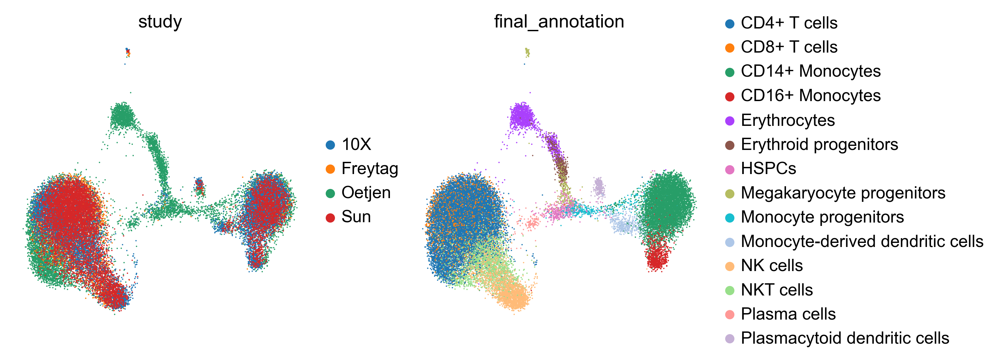

In [37]:
sc.pl.umap(adata, color=['study', 'final_annotation'], frameon=False)

In [38]:
#intr_cvae.save('model_wo_hsic_ref_BINF')

In [29]:
kang = sc.read('kang_count.h5ad')[:, adata.var_names].copy()

In [30]:
kang.obs['study'] = 'Kang'

In [31]:
q_intr_cvae = sca.models.TRVAE.load('model_query_new_ann_mask_rm_cyto', kang)


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 1972 300 5
	Hidden Layer 1 in/out: 300 300
	Hidden Layer 2 in/out: 300 300
	Mean/Var Layer in/out: 300 276
	Expanded Mean/Var Layer in/out: 300 4
Decoder Architecture:
	Cond layer in, ext, ext_m, cond, out and :  276 3 1 5 1972
	with hard mask.


In [104]:
q_intr_cvae = sca.models.TRVAE.load_query_data(kang, intr_cvae,
                                               unfreeze_ext=True, # do not freeze the unannotated terms weights
                                               new_n_ext_decoder=3,
                                               new_n_ext_m_decoder=1,
                                               new_n_expand_encoder=4,
                                               new_ext_mask=query_mask.T,
                                               new_soft_ext_mask=True
                                              )


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 1972 300 5
	Hidden Layer 1 in/out: 300 300
	Hidden Layer 2 in/out: 300 300
	Mean/Var Layer in/out: 300 276
	Expanded Mean/Var Layer in/out: 300 4
Decoder Architecture:
	Cond layer in, ext, ext_m, cond, out and :  276 3 1 5 1972
	with hard mask.


In [105]:
hsic = True
q_intr_cvae.use_hsic_ = hsic
q_intr_cvae.model.use_hsic = hsic
q_intr_cvae.hsic_one_vs_all_= hsic
q_intr_cvae.model.hsic_one_vs_all = hsic

In [106]:
q_intr_cvae.train(
    n_epochs=150, 
    alpha_epoch_anneal=50,
    alpha_kl=0.1,
    weight_decay=0., 
    alpha_l1=0.9,
    gamma_ext=0.7,
    gamma_epoch_anneal=50,
    beta=3.,
    seed=2020,
    use_early_stopping=False,
    print_n_deactive=True
)

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


Init soft mask proximal operator for annotated extension.
Init proximal operator for unannotated extension.
Share of deactivated inactive genes in extension terms: 0.0346
Active genes in extension terms: [1972 1972 1972]
Sparcity share in extension terms: [0. 0. 0.]
 |--------------------| 0.7%  - epoch_loss: 1146.93 - epoch_recon_loss: 1146.69 - epoch_kl_loss:   58.87 - epoch_hsic_loss:    0.08 - val_loss:  973.30 - val_recon_loss:  973.05 - val_kl_loss:   62.64 - val_hsic_loss:    0.08Share of deactivated inactive genes in extension terms: 0.1112
Active genes in extension terms: [1972 1972 1972]
Sparcity share in extension terms: [0. 0. 0.]
 |--------------------| 1.3%  - epoch_loss:  826.31 - epoch_recon_loss:  825.96 - epoch_kl_loss:   69.69 - epoch_hsic_loss:    0.07 - val_loss:  678.53 - val_recon_loss:  678.19 - val_kl_loss:   75.60 - val_hsic_loss:    0.06Share of deactivated inactive genes in extension terms: 0.2288
Active genes in extension terms: [1972 1972 1972]
Sparcity sh

 |█████---------------| 27.3%  - epoch_loss:  530.55 - epoch_recon_loss:  511.53 - epoch_kl_loss:  227.84 - epoch_hsic_loss:    0.26 - val_loss:  521.98 - val_recon_loss:  503.19 - val_kl_loss:  225.07 - val_hsic_loss:    0.26Share of deactivated inactive genes in extension terms: 0.9937
Active genes in extension terms: [1336 1435 1345]
Sparcity share in extension terms: [0.32 0.27 0.32]
 |█████---------------| 28.0%  - epoch_loss:  530.51 - epoch_recon_loss:  510.82 - epoch_kl_loss:  230.48 - epoch_hsic_loss:    0.26 - val_loss:  524.09 - val_recon_loss:  504.45 - val_kl_loss:  230.10 - val_hsic_loss:    0.26Share of deactivated inactive genes in extension terms: 0.9879
Active genes in extension terms: [1297 1451 1321]
Sparcity share in extension terms: [0.34 0.26 0.33]
 |█████---------------| 28.7%  - epoch_loss:  529.83 - epoch_recon_loss:  509.57 - epoch_kl_loss:  232.16 - epoch_hsic_loss:    0.25 - val_loss:  523.50 - val_recon_loss:  503.33 - val_kl_loss:  231.17 - val_hsic_loss:

Active genes in extension terms: [543 518  29]
Sparcity share in extension terms: [0.72 0.74 0.99]
 |███████████---------| 55.3%  - epoch_loss:  526.79 - epoch_recon_loss:  510.00 - epoch_kl_loss:  162.52 - epoch_hsic_loss:    0.18 - val_loss:  516.94 - val_recon_loss:  500.56 - val_kl_loss:  158.30 - val_hsic_loss:    0.18Share of deactivated inactive genes in extension terms: 0.8263
Active genes in extension terms: [509 509  19]
Sparcity share in extension terms: [0.74 0.74 0.99]
 |███████████---------| 56.0%  - epoch_loss:  525.16 - epoch_recon_loss:  508.64 - epoch_kl_loss:  159.83 - epoch_hsic_loss:    0.18 - val_loss:  517.58 - val_recon_loss:  501.36 - val_kl_loss:  156.80 - val_hsic_loss:    0.18Share of deactivated inactive genes in extension terms: 0.8468
Active genes in extension terms: [468 482  18]
Sparcity share in extension terms: [0.76 0.76 0.99]
 |███████████---------| 56.7%  - epoch_loss:  524.80 - epoch_recon_loss:  508.51 - epoch_kl_loss:  157.52 - epoch_hsic_loss: 

Active genes in extension terms: [409  85 650]
Sparcity share in extension terms: [0.79 0.96 0.67]
 |████████████████----| 83.3%  - epoch_loss:  518.39 - epoch_recon_loss:  506.47 - epoch_kl_loss:  112.68 - epoch_hsic_loss:    0.22 - val_loss:  509.16 - val_recon_loss:  497.43 - val_kl_loss:  110.74 - val_hsic_loss:    0.22Share of deactivated inactive genes in extension terms: 0.9984
Active genes in extension terms: [401  74 654]
Sparcity share in extension terms: [0.8  0.96 0.67]
 |████████████████----| 84.0%  - epoch_loss:  518.03 - epoch_recon_loss:  506.18 - epoch_kl_loss:  111.95 - epoch_hsic_loss:    0.22 - val_loss:  508.46 - val_recon_loss:  496.82 - val_kl_loss:  109.80 - val_hsic_loss:    0.22Share of deactivated inactive genes in extension terms: 0.9984
Active genes in extension terms: [419  66 657]
Sparcity share in extension terms: [0.79 0.97 0.67]
 |████████████████----| 84.7%  - epoch_loss:  517.24 - epoch_recon_loss:  505.44 - epoch_kl_loss:  111.36 - epoch_hsic_loss: 

In [149]:
#q_intr_cvae.save('model_query_new_ann_mask_rm_cyto')

In [32]:
ext_active = (q_intr_cvae.model.decoder.L0.ext_L.weight.data.abs() > 0).sum(0).cpu().numpy() > 5

In [33]:
inactive_idx = ~q_intr_cvae.model.decoder.nonzero_terms()

In [34]:
inactive_idx[-len(ext_active):] = ~ext_active

In [35]:
terms = adata.uns['terms'].copy()

In [36]:
terms += ['ann_ext_' + str(i) for i in range(q_intr_cvae.model.n_ext_m_decoder)]

In [37]:
terms += ['unannotated_' + str(i) for i in range(len(ext_active))]

In [38]:
MEAN = False

In [39]:
ext_active

array([ True,  True,  True])

In [41]:
# select unannotated term to plot
idx = [terms.index(term) for term in ['ann_ext_0', 'unannotated_0','unannotated_1', 'unannotated_2']]

In [42]:
latents = q_intr_cvae.get_latent(mean=MEAN)[:, idx]
kang.obs['ann_0'] = latents[:, 0]
kang.obs['unann_0'] = latents[:, 1]
kang.obs['unann_1'] = latents[:, 2]
kang.obs['unann_2'] = latents[:, 3]

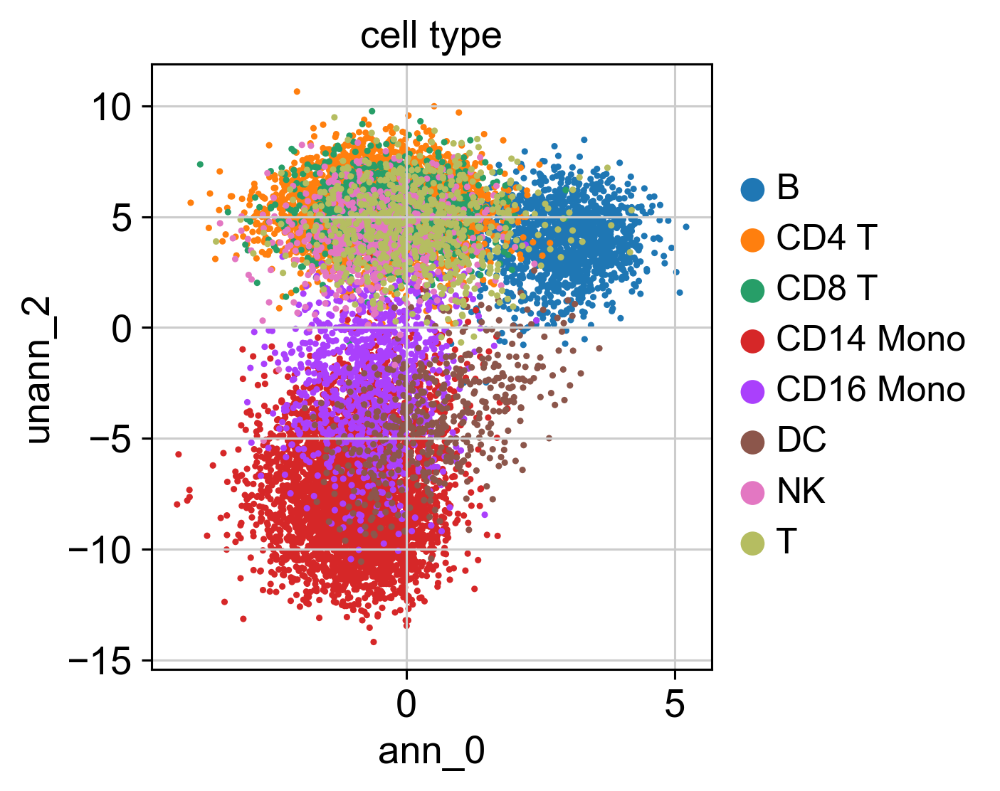

In [43]:
sc.pl.scatter(kang, x='ann_0', y='unann_2',
              color='cell_type',
              size=22)

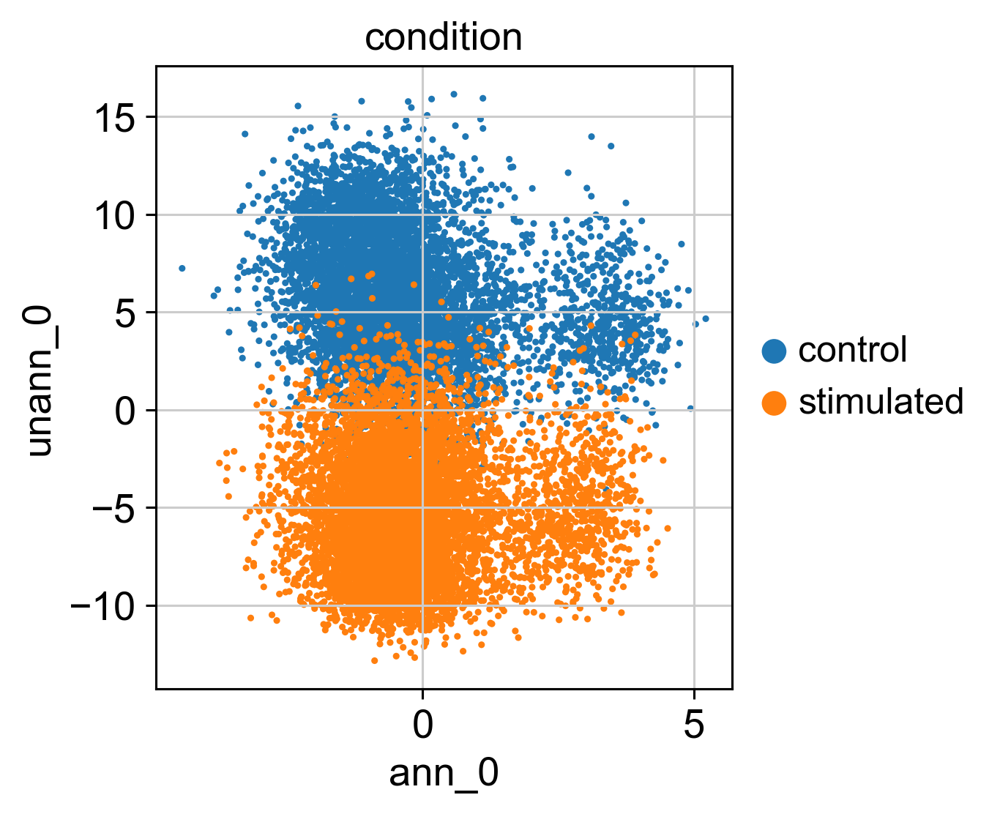

In [44]:
sc.pl.scatter(kang, x='ann_0', y='unann_0',
              color='condition',
              size=22)

In [45]:
scores_cond = q_intr_cvae.latent_enrich('condition', comparison="control", adata=kang, n_perm=7000)

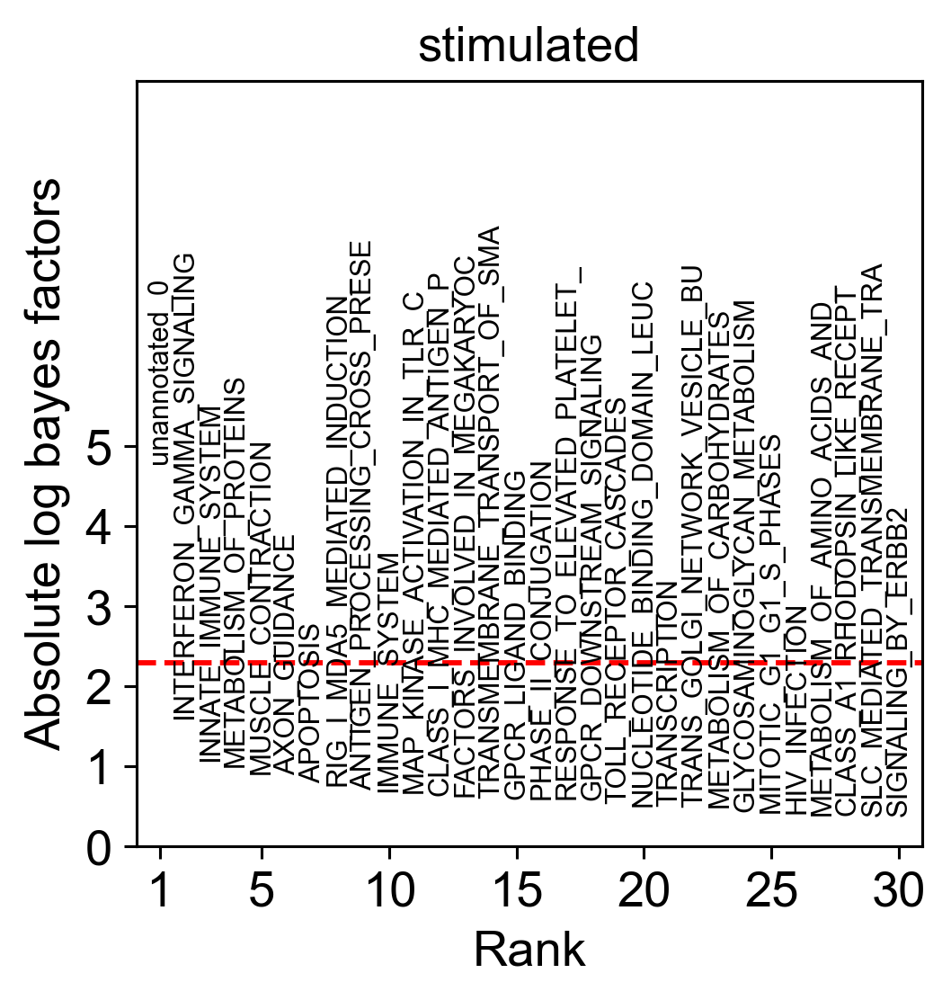

In [46]:
fig = sca.plotting.plot_abs_bfs(scores_cond, np.array(terms), keys='stimulated', yt_step=1, fontsize=8, scale_y=2)

In [47]:
scores_ct = q_intr_cvae.latent_enrich('cell_type', n_perm=7000, adata=kang)

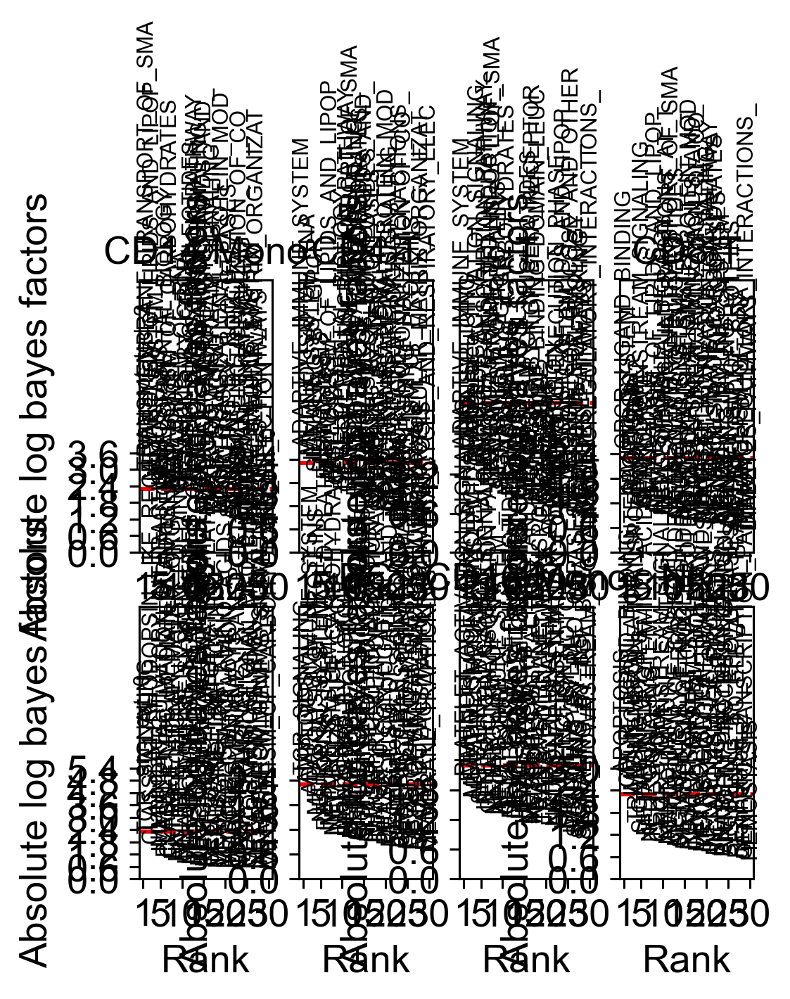

In [48]:
fig = sca.plotting.plot_abs_bfs(scores_ct, np.array(terms), n_cols=4, scale_y=2.6, yt_step=0.6)

In [49]:
fig.set_size_inches(24, 12)

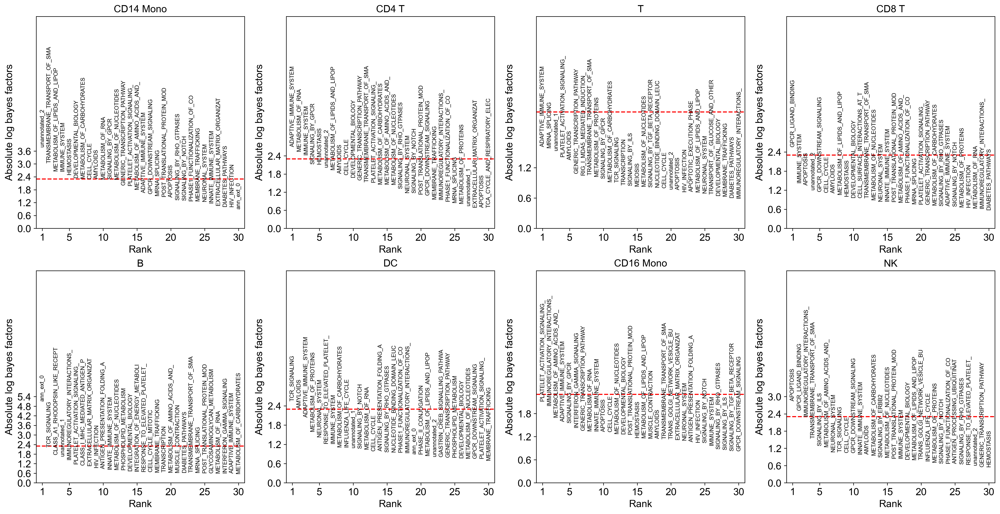

In [50]:
fig

In [73]:
kang_pbmc = sc.AnnData.concatenate(adata, kang, batch_key='batch_join')

In [74]:
kang_pbmc.obsm['X_cvae'] = q_intr_cvae.get_latent(kang_pbmc.X, kang_pbmc.obs['study'].tolist(), mean=MEAN)[:, ~inactive_idx]

In [75]:
sc.pp.neighbors(kang_pbmc, use_rep='X_cvae')
sc.tl.umap(kang_pbmc)

In [76]:
kang_pbmc.strings_to_categoricals()

... storing 'batch' as categorical
... storing 'chemistry' as categorical
... storing 'data_type' as categorical
... storing 'final_annotation' as categorical
... storing 'sample_ID' as categorical
... storing 'species' as categorical
... storing 'study' as categorical
... storing 'tissue' as categorical
... storing 'orig.ident' as categorical
... storing 'stim' as categorical
... storing 'seurat_annotations' as categorical
... storing 'condition' as categorical
... storing 'cell_type' as categorical


In [77]:
kang_pbmc.obs['cell_type_joint'] = kang_pbmc.obs['final_annotation'].tolist()

In [78]:
idx_1 = kang_pbmc.obs['cell_type_joint'].astype(str) == 'nan'
idx_2 = kang_pbmc.obs['cell_type'].astype(str) != 'nan'
kang_pbmc.obs['cell_type_joint'][idx_1] = kang_pbmc.obs['cell_type'][idx_2].tolist()

In [79]:
categories = np.unique(kang_pbmc.obs['cell_type_joint'])

In [80]:
categories

array(['B', 'CD14 Mono', 'CD14+ Monocytes', 'CD16 Mono',
       'CD16+ Monocytes', 'CD4 T', 'CD4+ T cells', 'CD8 T',
       'CD8+ T cells', 'DC', 'Erythrocytes', 'Erythroid progenitors',
       'HSPCs', 'Megakaryocyte progenitors', 'Monocyte progenitors',
       'Monocyte-derived dendritic cells', 'NK', 'NK cells', 'NKT cells',
       'Plasma cells', 'Plasmacytoid dendritic cells', 'T'], dtype=object)

In [81]:
celltypes_replace = {}
celltypes_replace['CD20+ B cells'] = 'B'
celltypes_replace['CD4 T'] = 'CD4+ T cells'
celltypes_replace['CD8 T'] = 'CD8+ T cells'
celltypes_replace['CD14 Mono'] = 'CD14+ Monocytes'
celltypes_replace['CD16 Mono'] = 'CD16+ Monocytes'
celltypes_replace['NK'] = 'NK cells'

In [82]:
for cat in categories:
    if cat in celltypes_replace:
        kang_pbmc.obs['cell_type_joint'][kang_pbmc.obs['cell_type_joint']==cat] = celltypes_replace[cat]

In [83]:
kang_pbmc.obs['condition_joint'] = kang_pbmc.obs['condition'].copy()

In [84]:
kang_pbmc.obs['condition_joint'][kang_pbmc.obs['condition_joint'].isna()] = 'control'

... storing 'cell_type_joint' as categorical


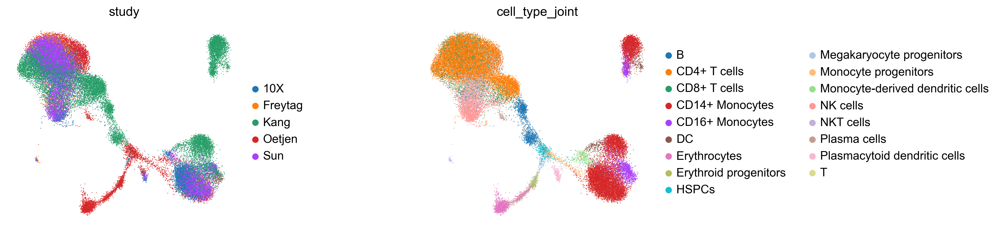

In [53]:
sc.pl.umap(kang_pbmc, color=['study', 'cell_type_joint'], frameon=False, wspace=0.6)

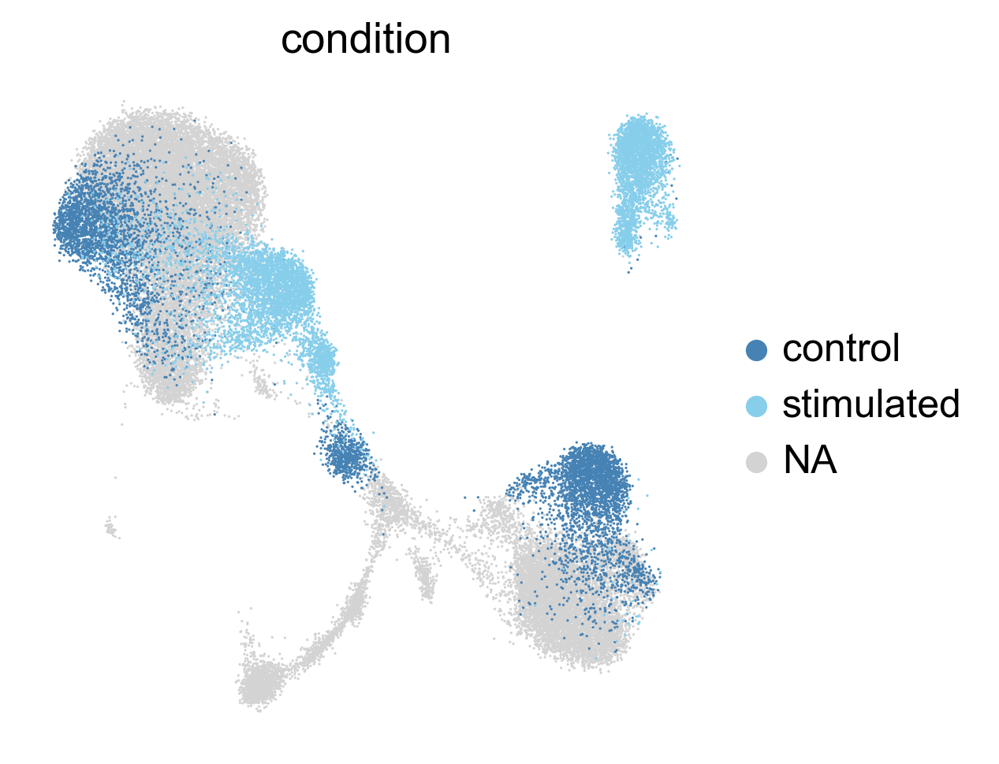

In [54]:
sc.pl.umap(kang_pbmc, color='condition',
           frameon=False, 
           wspace=0.6,
           palette=['steelblue', 'skyblue', 'red'])

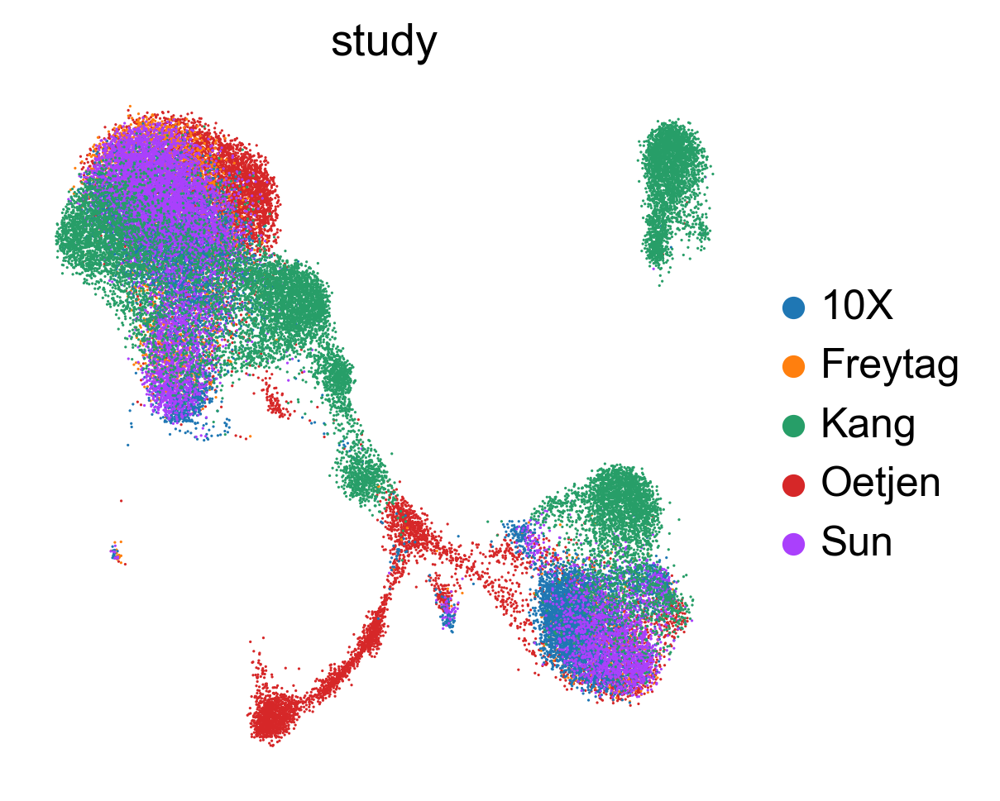

In [55]:
sc.pl.umap(kang_pbmc, color='study', frameon=False, wspace=0.6)

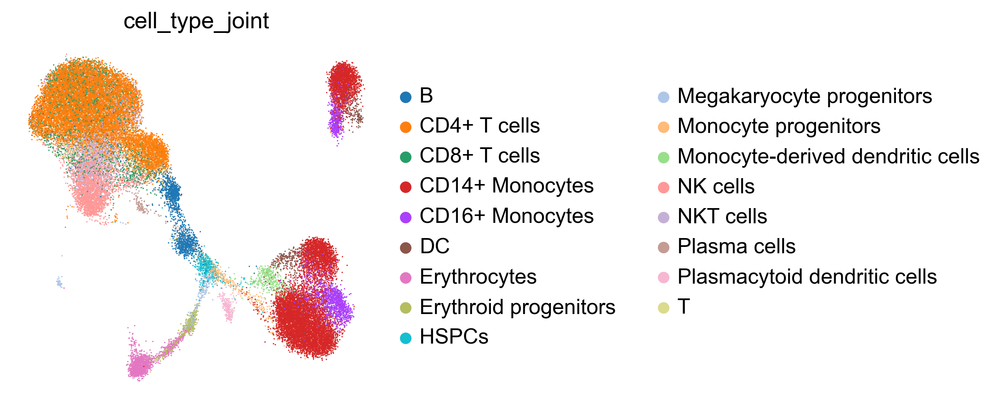

In [56]:
sc.pl.umap(kang_pbmc, color='cell_type_joint', frameon=False, wspace=0.6)

In [68]:
scores_cond = q_intr_cvae.latent_enrich('condition_joint', comparison="control", adata=kang_pbmc, n_perm=12000)

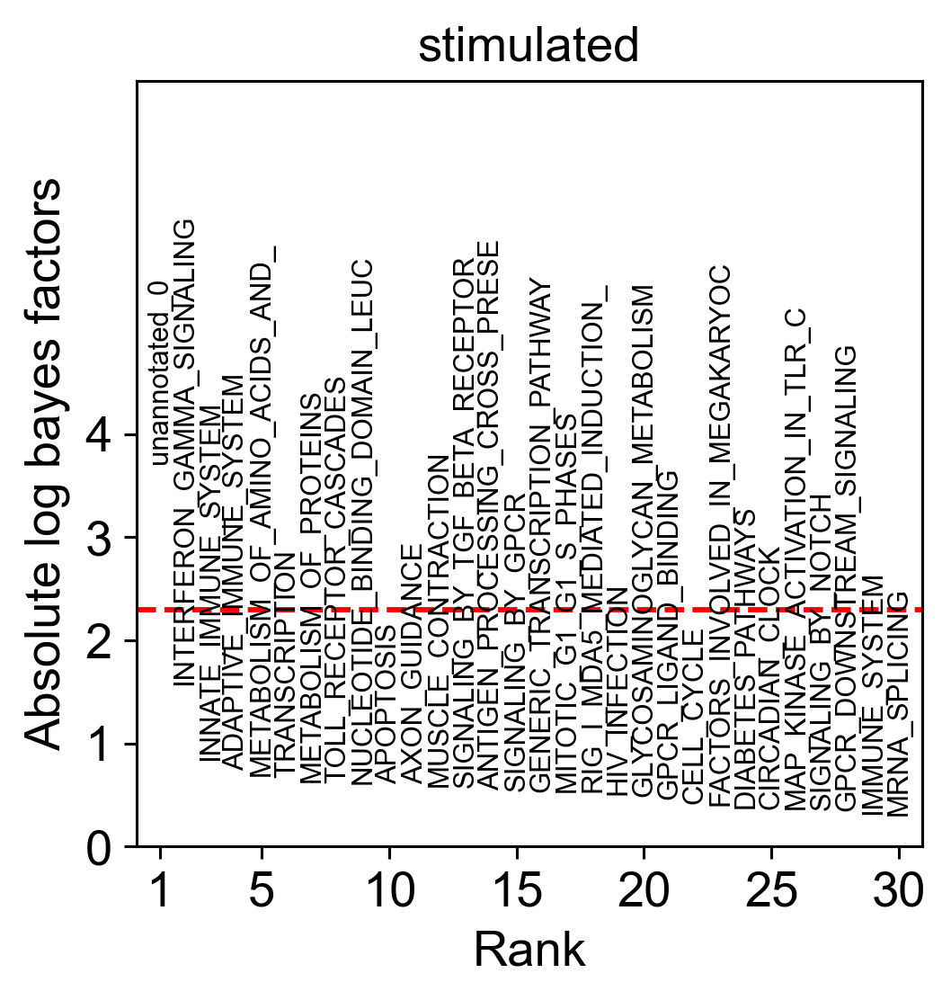

In [69]:
fig = sca.plotting.plot_abs_bfs(scores_cond, np.array(terms), keys='stimulated', yt_step=1, fontsize=8, scale_y=2)

In [90]:
latents = q_intr_cvae.get_latent(kang_pbmc.X, kang_pbmc.obs['study'].tolist(), mean=MEAN)[:, idx]
kang_pbmc.obs['B masked'] = latents[:, 0]
kang_pbmc.obs['term 2'] = latents[:, 1]
kang_pbmc.obs['term 3'] = latents[:, 2]
kang_pbmc.obs['term 1'] = latents[:, 3]

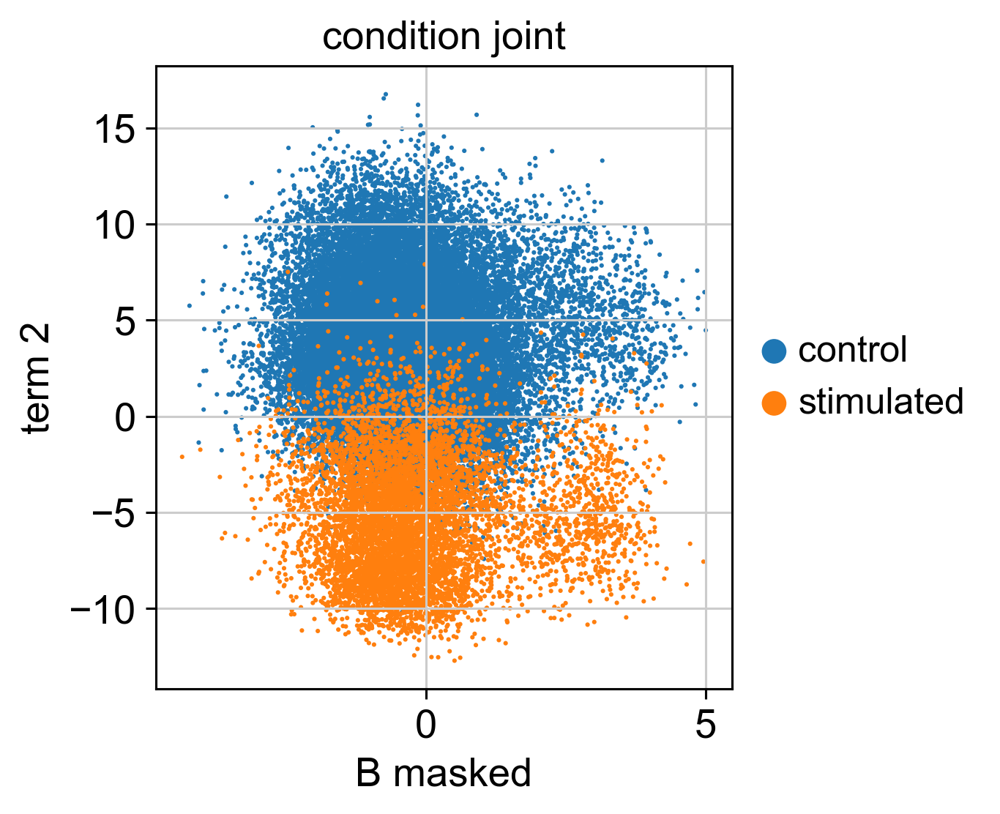

In [294]:
sc.pl.scatter(kang_pbmc, x='B masked', y='term 2',
              color='condition_joint', size=10)

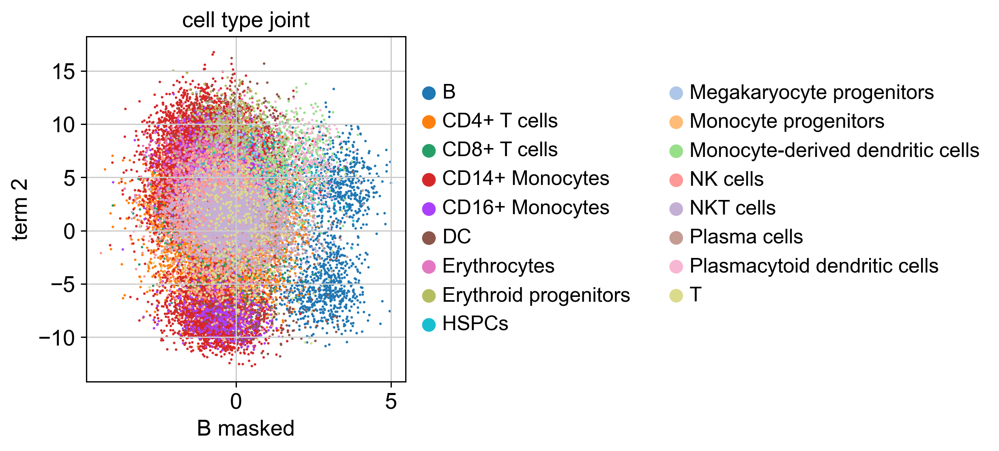

In [295]:
sc.pl.scatter(kang_pbmc, x='B masked', y='term 2',
              color='cell_type_joint', size=10)

In [44]:
unann_ifn = q_intr_cvae.model.decoder.L0.ext_L.weight[:, 0].abs().data.cpu().numpy()

In [45]:
top = 50

In [46]:
srt = np.argsort(unann_ifn)[::-1][:top]

In [69]:
ifn_top = len(set(srt).intersection(np.where(ifn_mask)[0]))

In [48]:
ifn_genes_top = kang.var_names[srt].tolist()

In [89]:
kang_proc = kang.copy()
sc.pp.normalize_per_cell(kang_proc)
sc.pp.log1p(kang_proc)

In [90]:
sc.tl.rank_genes_groups(kang_proc, 'condition', use_raw=False, n_genes=100, method='wilcoxon', tie_correct=True, rankby_abs=True)

In [53]:
ifn_de = len(set(ifn_genes_top).intersection(kang_proc.uns['rank_genes_groups']['names']['stimulated']))

In [54]:
df = pd.DataFrame(index=['unannot_0'])

In [55]:
df['INTERFERON_SIGNALLING'] = ifn_top / top

In [56]:
df['IFN_VS_CTRL_DEG'] = ifn_de / top

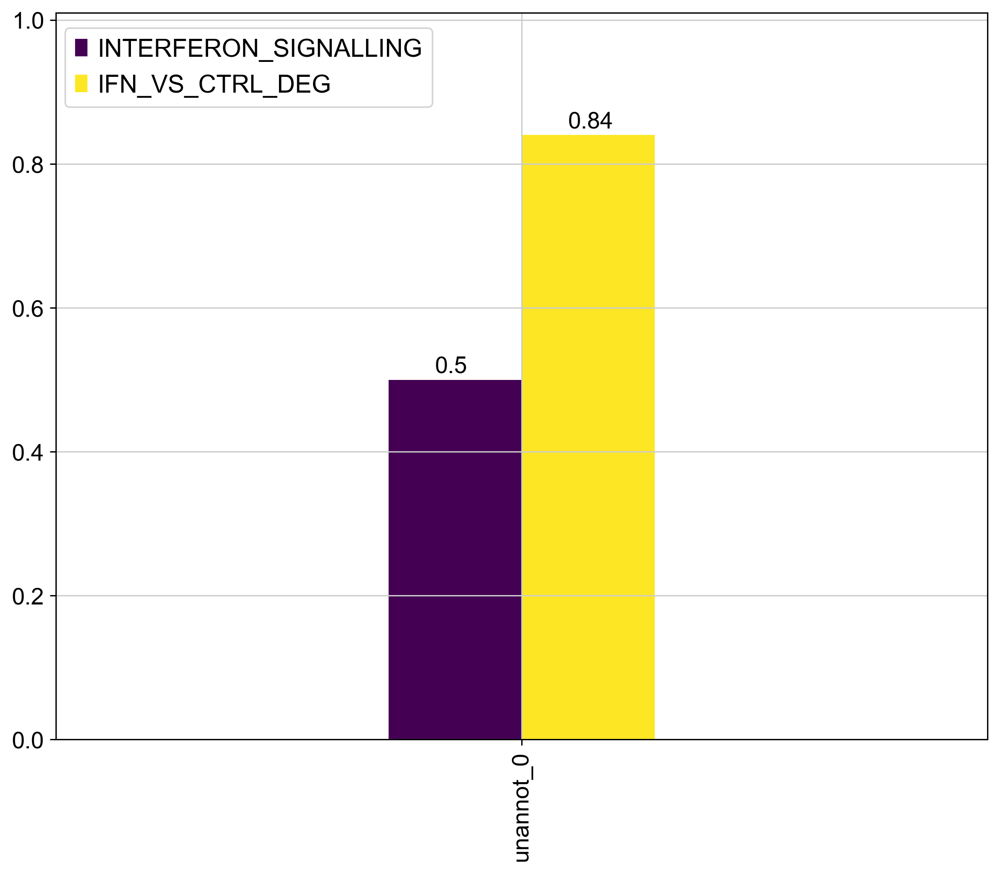

In [57]:
ax = df.sort_values(by='unannot_0', axis=1).plot.bar(figsize=(10,8), ylim=(0,1.01), colormap='viridis', width=0.2)
plt.legend(fontsize=15, loc=(0.01, 0.87))
for p in ax.patches:
    ax.annotate(str(p.get_height()), xy=(p.get_x() + 0.35*p.get_width(), p.get_height() + 0.01))

In [178]:
bar_df = df.T.sort_values(by='unannot_0', axis=0)

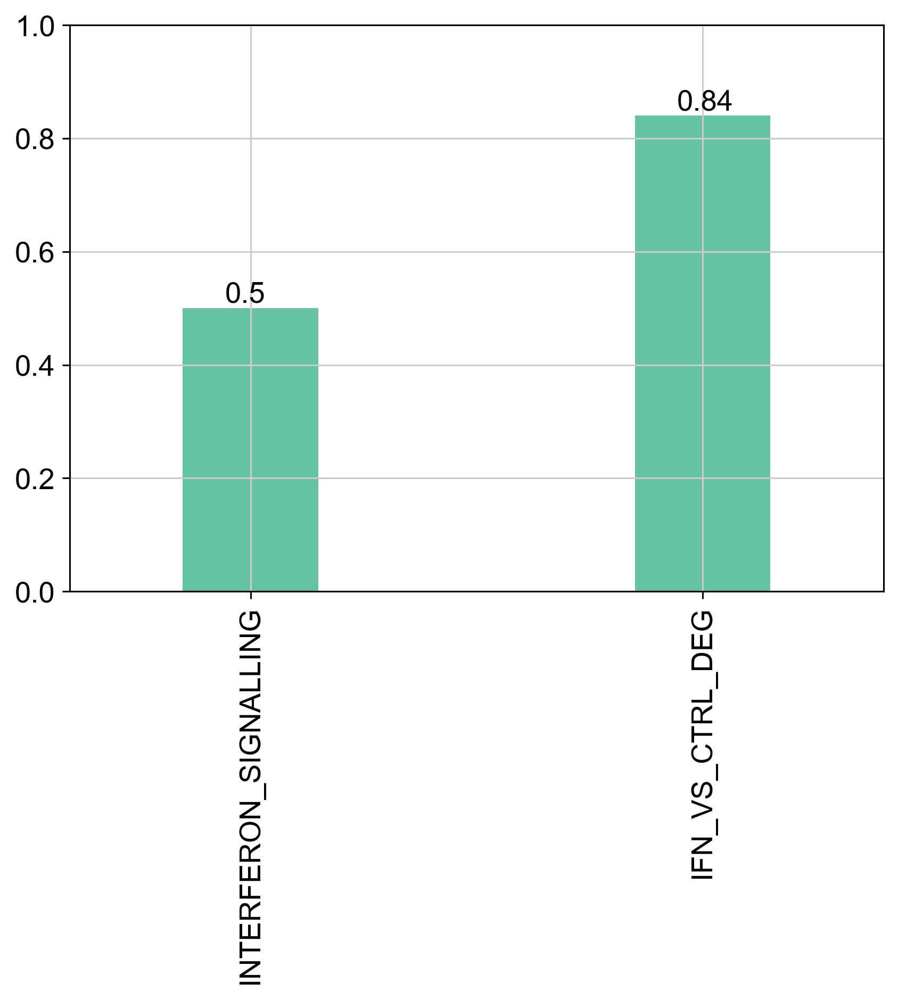

In [179]:
ax = bar_df.plot.bar(figsize=(7,5), ylim=(0,1), legend=False, width=0.3)
for p in ax.patches:
    height = p.get_height()
    ax.annotate(str(height), xy=(p.get_x() + 0.31*p.get_width(), p.get_height() + 0.01))

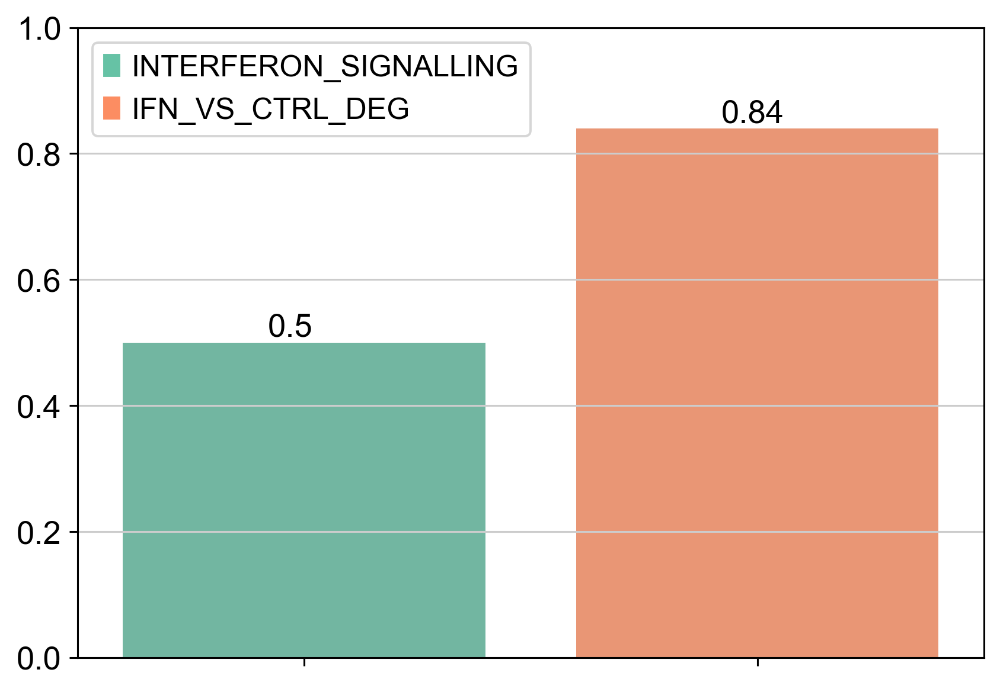

In [180]:
sb.set_palette("Set2")
ax = sb.barplot(data=df)
ax.set(ylim=(0, 1))
for p in ax.patches:
    height = p.get_height()
    ax.annotate(str(height), xy=(p.get_x() + 0.4*p.get_width(), p.get_height() + 0.01))

patches = [matplotlib.patches.Patch(color=sb.color_palette()[i], label=t) for i,t in enumerate(t.get_text() for t in ax.get_xticklabels())]
plt.legend(handles=patches, loc="upper left")
ax.xaxis.set_ticklabels([])

ax.figure.set_size_inches(7, 5)

In [58]:
ifn_weights = q_intr_cvae.model.decoder.L0.ext_L.weight[:, 0].data.cpu().numpy()

In [59]:
ifn_nz = unann_ifn > 0

In [60]:
ifn_table = pd.DataFrame(index=adata.var_names[ifn_nz].tolist())

In [62]:
ifn_table['decoder_weights'] = ifn_weights[ifn_nz]

In [64]:
ifn_table['weights_abs'] = unann_ifn[ifn_nz]

In [65]:
ifn_table.sort_values('weights_abs', ascending=False, inplace=True)

In [67]:
del ifn_table['weights_abs']

In [68]:
ifn_table['INTERFERON_SIGNALLING'] = False

In [81]:
ifn_table['INTERFERON_SIGNALLING'][ifn_table.index.isin(adata.var_names[ifn_mask[:, 0].astype(bool)])] = True

In [88]:
ifn_table['IFN_VS_CTRL_DEG'] = False

In [94]:
ifn_table['IFN_VS_CTRL_DEG'][ifn_table.index.isin(kang_proc.uns['rank_genes_groups']['names']['stimulated'])] = True

In [102]:
ifn_table.to_csv('ifn_node.csv')

In [103]:
kang_proc = kang_proc[kang_proc.obs.condition=='control'].copy()

In [104]:
unann_my = q_intr_cvae.model.decoder.L0.ext_L.weight[:, 2].abs().data.cpu().numpy()

In [105]:
srt = np.argsort(unann_my)[::-1][:top]

In [106]:
srt_30 = np.argsort(unann_my)[::-1][:30]

In [107]:
my_genes_top_30 = kang.var_names[srt_30].tolist()

In [108]:
my_genes_top_30

['RGS2',
 'TIMP1',
 'CCL2',
 'PLA2G7',
 'HSPB1',
 'CX3CR1',
 'CYSLTR1',
 'PTGER2',
 'GMPR',
 'CCR5',
 'CTSB',
 'ADA',
 'PDE7A',
 'TXN',
 'GCLM',
 'SCT',
 'SELL',
 'SATB1',
 'CD63',
 'HPSE',
 'NOP56',
 'GSTO1',
 'MEF2C',
 'SLC24A4',
 'FYN',
 'MGST1',
 'XPC',
 'PIGX',
 'S1PR4',
 'GLIPR1']

In [109]:
my_genes_top = kang.var_names[srt].tolist()

In [110]:
kang.obs['myeloids'] = 'rest'
for c in range(kang.n_obs):
    kang.obs['myeloids'][c] = 'myeloid' if np.isin(kang.obs['cell_type'][c], ['CD14 Mono', 'CD16 Mono', 'DC']) else 'rest'

In [111]:
kang_proc.obs['myeloids'] = kang.obs['myeloids']

In [112]:
sc.tl.rank_genes_groups(kang_proc, 'myeloids', use_raw=False, n_genes=100, method='wilcoxon', tie_correct=True, rankby_abs=True, 
                        key_added='de_myeloid')

In [113]:
my_de = len(set(my_genes_top).intersection(kang_proc.uns['de_myeloid']['names']['myeloid']))

In [114]:
kang_me = kang.copy()
sc.pp.normalize_total(kang_me)
sc.pp.log1p(kang_me)
kang_me = kang_me[kang_me.obs.myeloids == 'myeloid'].copy()

In [115]:
sc.tl.rank_genes_groups(kang_me, 'condition', use_raw=False, n_genes=100, method='wilcoxon', tie_correct=True, rankby_abs=True, 
                        key_added='de_myeloid_cond')

In [116]:
cond_de = len(set(my_genes_top).intersection(kang_me.uns['de_myeloid_cond']['names']['stimulated']))

In [117]:
df = pd.DataFrame(index=['unannot_2'])

In [118]:
df['MYELOIDS_DEG'] = my_de / top

In [119]:
df['MYELOIDS_STIMULATED_DEG'] = cond_de / top

In [120]:
q_intr_cvae.adata.uns['terms'] = adata.uns['terms'].copy()

In [121]:
for term in adata.uns['terms']:
    l = len(set(my_genes_top).intersection(q_intr_cvae.terms_genes()[term]))
    if l >= 10:
        df[term] = l / top
        print(term, l)

SIGNALING_BY_GPCR 12
GPCR_DOWNSTREAM_SIGNALING 10
GPCR_LIGAND_BINDING 10
IMMUNE_SYSTEM 12


In [122]:
del df['GPCR_DOWNSTREAM_SIGNALING']

In [123]:
del df['GPCR_LIGAND_BINDING']

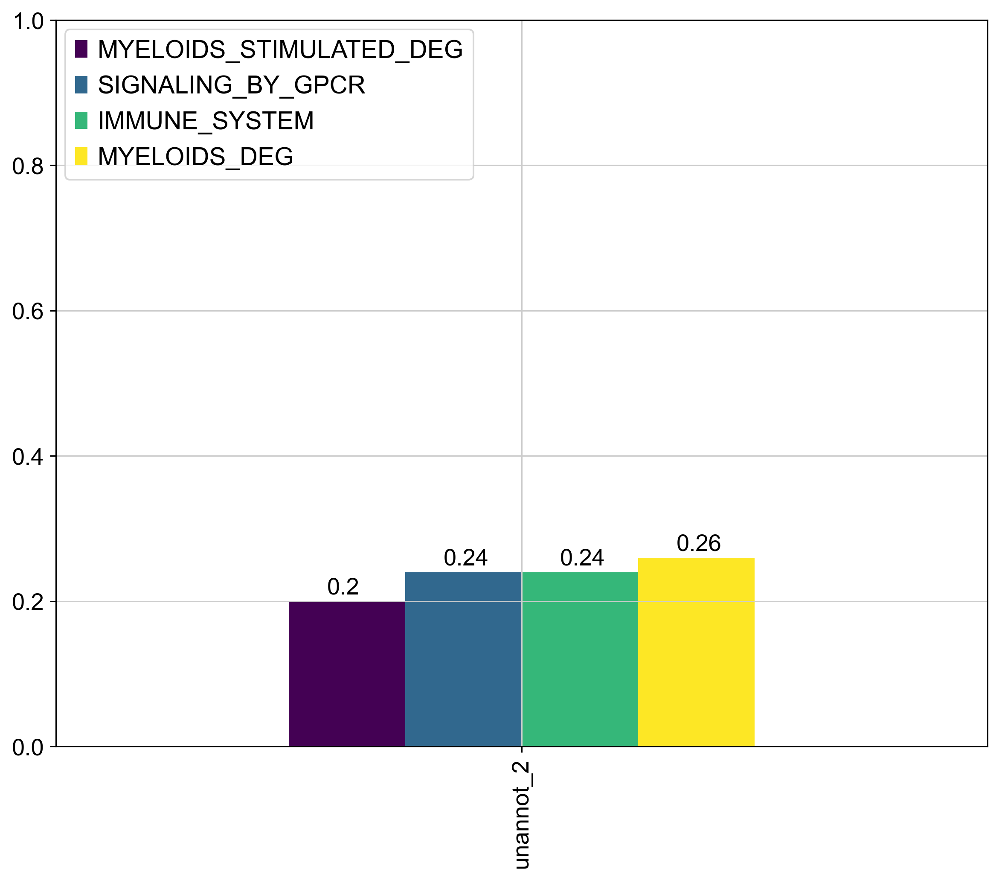

In [124]:
ax = df.sort_values(by='unannot_2', axis=1).plot.bar(figsize=(10,8), ylim=(0,1), colormap='viridis', width=0.5)
plt.legend(fontsize=15, loc=(0.01, 0.78))
for p in ax.patches:
    ax.annotate(str(p.get_height()), xy=(p.get_x() + 0.33*p.get_width(), p.get_height() + 0.01))

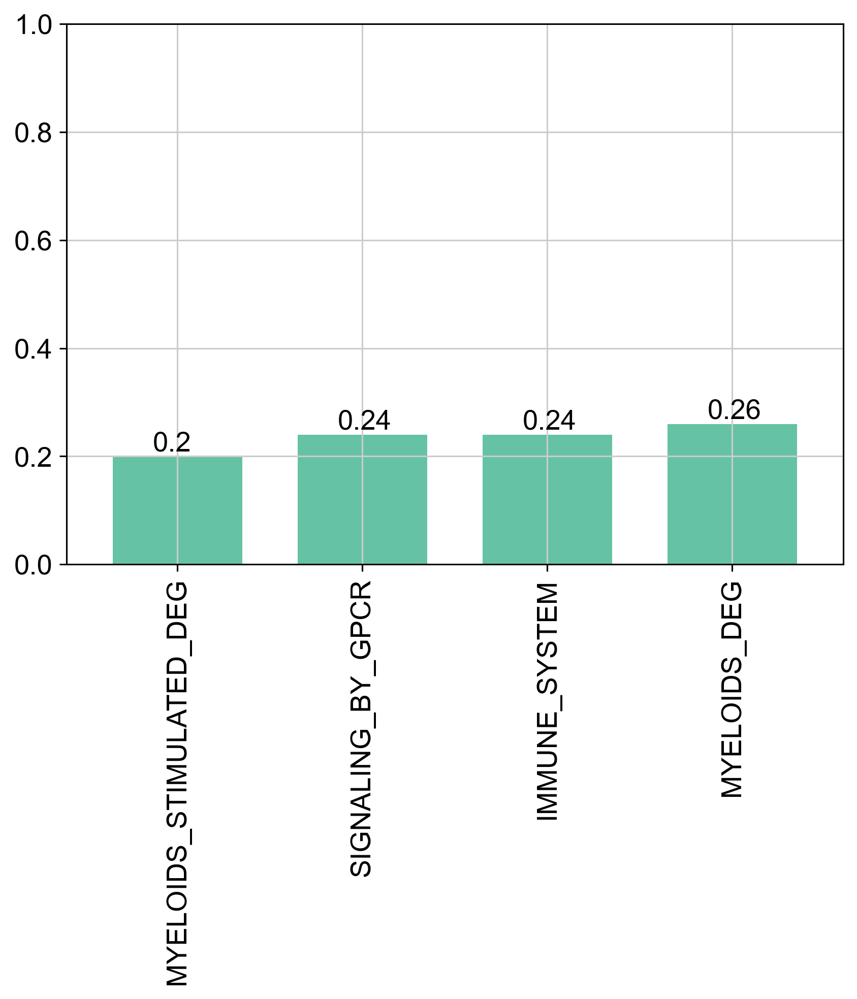

In [204]:
ax = df.T.sort_values(by='unannot_2', axis=0).plot.bar(figsize=(7,5), ylim=(0,1), legend=False, width=0.7)
for p in ax.patches:
    height = p.get_height()
    ax.annotate(str(height), xy=(p.get_x() + 0.31*p.get_width(), p.get_height() + 0.01))

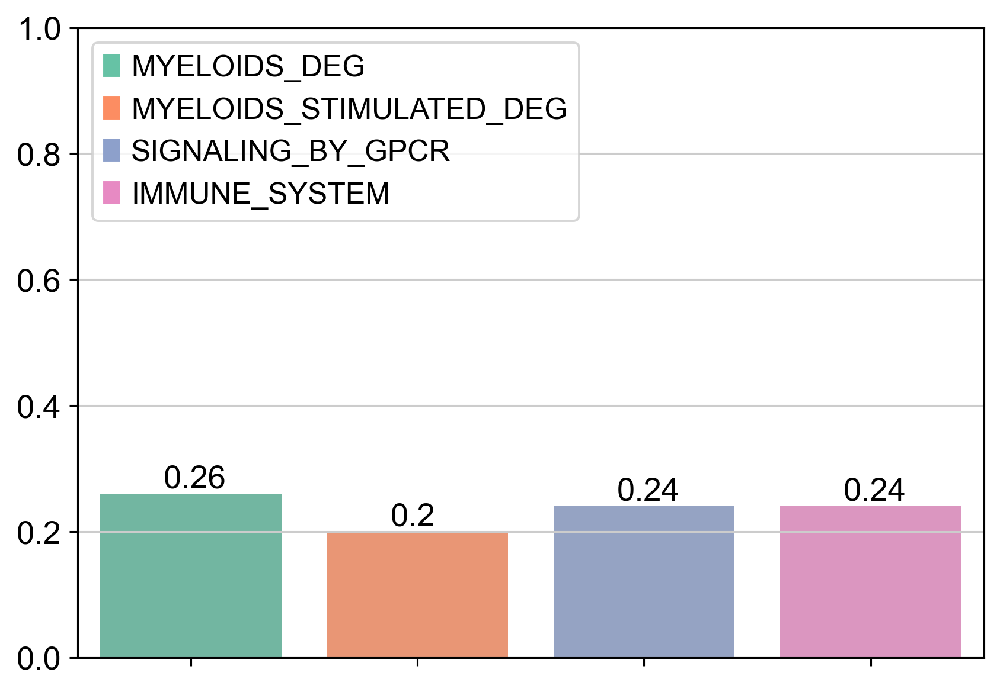

In [205]:
sb.set_palette("Set2")
ax = sb.barplot(data=df)
ax.set(ylim=(0, 1))
for p in ax.patches:
    height = p.get_height()
    ax.annotate(str(height), xy=(p.get_x() + 0.35*p.get_width(), p.get_height() + 0.01))

patches = [matplotlib.patches.Patch(color=sb.color_palette()[i], label=t) for i,t in enumerate(t.get_text() for t in ax.get_xticklabels())]
plt.legend(handles=patches, loc="upper left")
ax.xaxis.set_ticklabels([])

ax.figure.set_size_inches(7, 5)

In [125]:
my_weights = q_intr_cvae.model.decoder.L0.ext_L.weight[:, 2].data.cpu().numpy()

In [126]:
my_nz = unann_my > 0

In [127]:
my_table = pd.DataFrame(index=adata.var_names[my_nz].tolist())

In [129]:
my_table['decoder_weights'] = my_weights[my_nz]

In [130]:
my_table['weights_abs'] = unann_my[my_nz]

In [131]:
my_table.sort_values('weights_abs', ascending=False, inplace=True)

In [132]:
del my_table['weights_abs']

In [136]:
my_table['SIGNALING_BY_GPCR'] = False

In [137]:
my_table['SIGNALING_BY_GPCR'][my_table.index.isin(q_intr_cvae.terms_genes()['SIGNALING_BY_GPCR'])] = True

In [138]:
my_table['IMMUNE_SYSTEM'] = False

In [139]:
my_table['IMMUNE_SYSTEM'][my_table.index.isin(q_intr_cvae.terms_genes()['IMMUNE_SYSTEM'])] = True

In [145]:
my_table['MYELOIDS_DEG'] = False

In [146]:
my_table['MYELOIDS_DEG'][my_table.index.isin(kang_proc.uns['de_myeloid']['names']['myeloid'])] = True

In [147]:
my_table['MYELOIDS_STIMULATED_DEG'] = False

In [148]:
my_table['MYELOIDS_STIMULATED_DEG'][my_table.index.isin(kang_me.uns['de_myeloid_cond']['names']['stimulated'])] = True

In [153]:
my_table.to_csv('my_node.csv')

In [206]:
df = pd.DataFrame(index=['unannot_2'])

In [207]:
df['PLATELET_ACTIVATION_SIGNALING_AND_AGGREGATION'] = len(set(my_genes_top).intersection(q_intr_cvae.terms_genes()['PLATELET_ACTIVATION_SIGNALING_'])) / top

In [208]:
df['METABOLISM_OF_LIPIDS_AND_LIPOPOPROTEINS'] = len(set(my_genes_top).intersection(q_intr_cvae.terms_genes()['METABOLISM_OF_LIPIDS_AND_LIPOP'])) / top

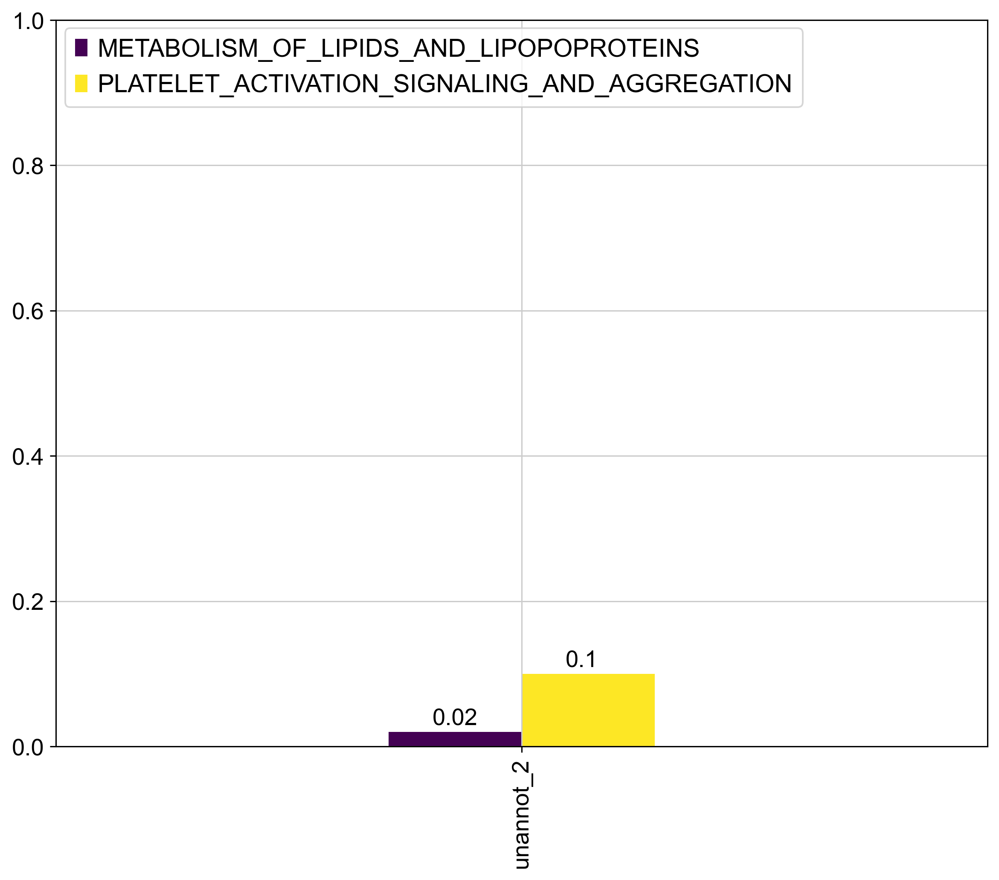

In [209]:
ax = df.sort_values(by='unannot_2', axis=1).plot.bar(figsize=(10,8), ylim=(0,1), colormap='viridis', width=0.2)
plt.legend(fontsize=15, loc=(0.01, 0.88))
for p in ax.patches:
    ax.annotate(str(p.get_height()), xy=(p.get_x() + 0.33*p.get_width(), p.get_height() + 0.01))

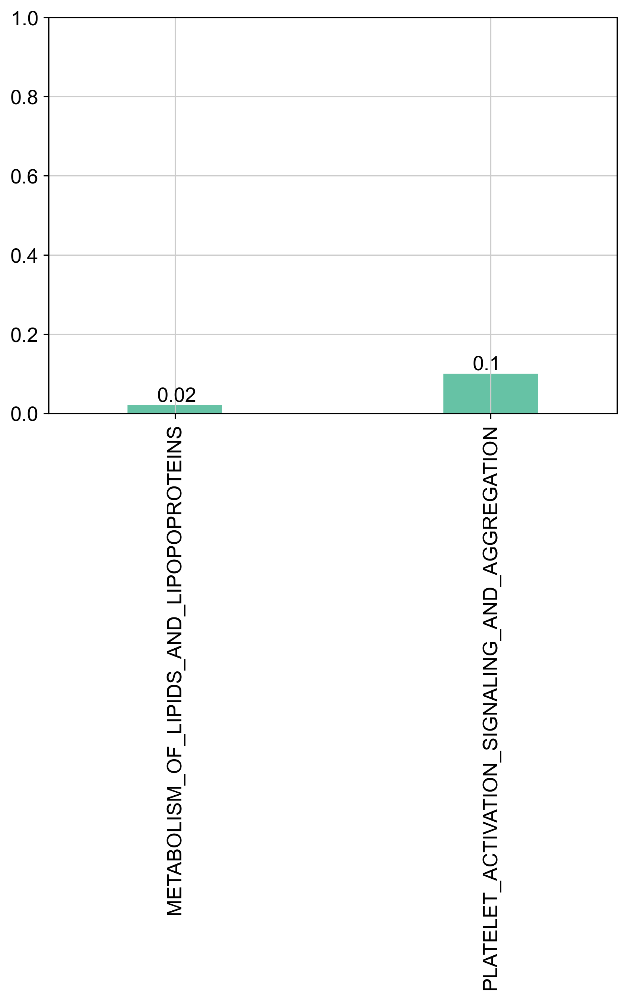

In [210]:
ax = df.T.sort_values(by='unannot_2', axis=0).plot.bar(figsize=(7,5), ylim=(0,1), legend=False, width=0.3)
for p in ax.patches:
    height = p.get_height()
    ax.annotate(str(height), xy=(p.get_x() + 0.31*p.get_width(), p.get_height() + 0.01))

In [211]:
ann_b = q_intr_cvae.model.decoder.L0.ext_L_m.weight[:, 0].abs().data.cpu().numpy()

In [212]:
query_mask.sum()

66

In [213]:
b_nz = np.abs(ann_b) > 0

In [214]:
b_nz.sum()

84

In [215]:
not_b = list(set(np.where(b_nz)[0]).difference(np.where(query_mask)[0]))

In [216]:
not_b_names = adata.var_names[not_b].tolist()

In [217]:
srt = np.argsort(ann_b)[::-1][:b_nz.sum()]

In [218]:
b_top = len(set(srt).intersection(np.where(query_mask)[0]))

In [219]:
b_genes_top = kang.var_names[srt].tolist()

In [220]:
srt_50 = np.argsort(ann_b)[::-1][:50]

In [221]:
b_not = set(srt_50).difference(np.where(query_mask)[0])

In [222]:
adata.var_names[list(b_not)].tolist()

['CD74']

In [223]:
kang_proc.obs['b'] = 'rest'
for c in range(kang_proc.n_obs):
    kang_proc.obs['b'][c] = 'B' if np.isin(kang_proc.obs['cell_type'][c], ['B']) else 'rest'

In [224]:
sc.tl.rank_genes_groups(kang_proc, 'b', use_raw=False, n_genes=100, method='wilcoxon', tie_correct=True, rankby_abs=True, 
                        key_added='b_de')

... storing 'b' as categorical


In [225]:
kang_proc.uns['b_de']['names']['B']

array(['CD79A', 'CD74', 'CD79B', 'HLA-DQA1', 'HERPUD1', 'BLNK', 'ANXA1',
       'HLA-DPA1', 'HLA-DRB1', 'HLA-DPB1', 'RPS5', 'IRF8', 'GNG7',
       'RPS23', 'TIMP1', 'RPL23A', 'FCER1G', 'BLK', 'CD19', 'RPL10A',
       'TYROBP', 'RPS8', 'TCF4', 'FTH1', 'RPSA', 'CCR7', 'RPS19', 'RPS6',
       'RPLP1', 'CST3', 'RPL13', 'RPL5', 'RPL3', 'PLAUR', 'TPD52',
       'RPS18', 'REL', 'RPS4X', 'LYZ', 'PMAIP1', 'RPS3', 'CD40', 'SRGN',
       'CD14', 'ARHGAP24', 'HLA-B', 'RPL14', 'CXCR4', 'LGALS3', 'RPS25',
       'RPL34', 'LIMS1', 'CD72', 'CTSB', 'EBF1', 'RPL30', 'TMSB4X', 'B2M',
       'SEMA7A', 'VIM', 'RPS12', 'PARP1', 'CHPT1', 'CD63', 'KYNU',
       'GSTO1', 'PLA2G7', 'ISG20', 'RAC1', 'EZR', 'GAPDH', 'GSTP1',
       'FCGR3A', 'PSAP', 'ZFP36L1', 'RPS24', 'C3AR1', 'RPL31', 'CD3D',
       'CXCL16', 'CEBPB', 'NCF2', 'SERPINA1', 'BIRC3', 'CFD', 'PSAT1',
       'IL7R', 'CD2', 'SDCBP', 'PTPRC', 'C5AR1', 'CTSD', 'RPS21', 'ASNS',
       'ODC1', 'SAT1', 'MGST1', 'NOP56', 'SLC16A3', 'HLA-DMA'],
      dtype=o

In [226]:
#b_de = len(set(b_genes_top).intersection(kang_proc.uns['b_de']['names']['B']))

In [227]:
b_de = len(set(not_b_names).intersection(kang_proc.uns['b_de']['names']['B']))

In [228]:
df = pd.DataFrame(index=['annotated_b'])

In [229]:
df['OTHERS'] =  b_nz.sum() - b_de - b_top

In [230]:
df['B_CELLS_DEG'] = b_de

In [231]:
df['SIGNALING_BY_THE_B_CELL_RECEPTOR'] = b_top 

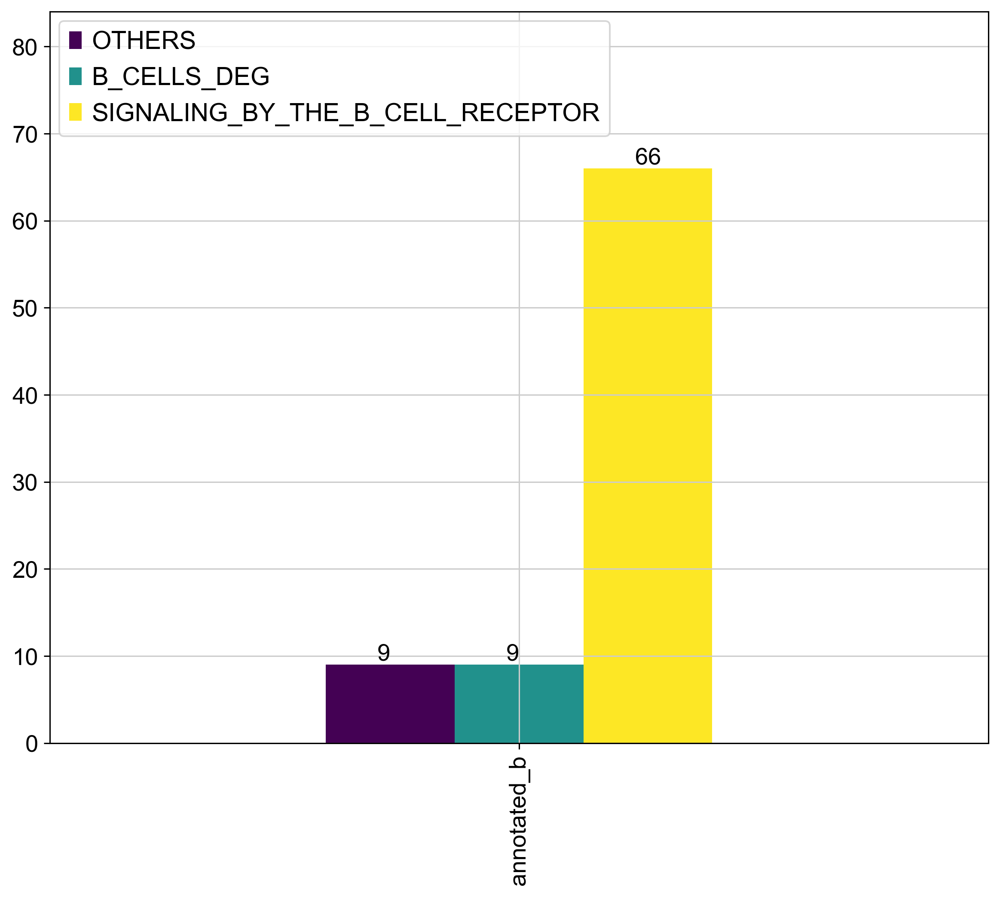

In [232]:
ax = df.plot.bar(figsize=(10,8), ylim=(0,b_nz.sum()), colormap='viridis', width=0.35)
plt.legend(fontsize=15, loc=(0.01, 0.83))
for p in ax.patches:
    ax.annotate(str(p.get_height()), xy=(p.get_x() + 0.4*p.get_width(), p.get_height() + 0.5))

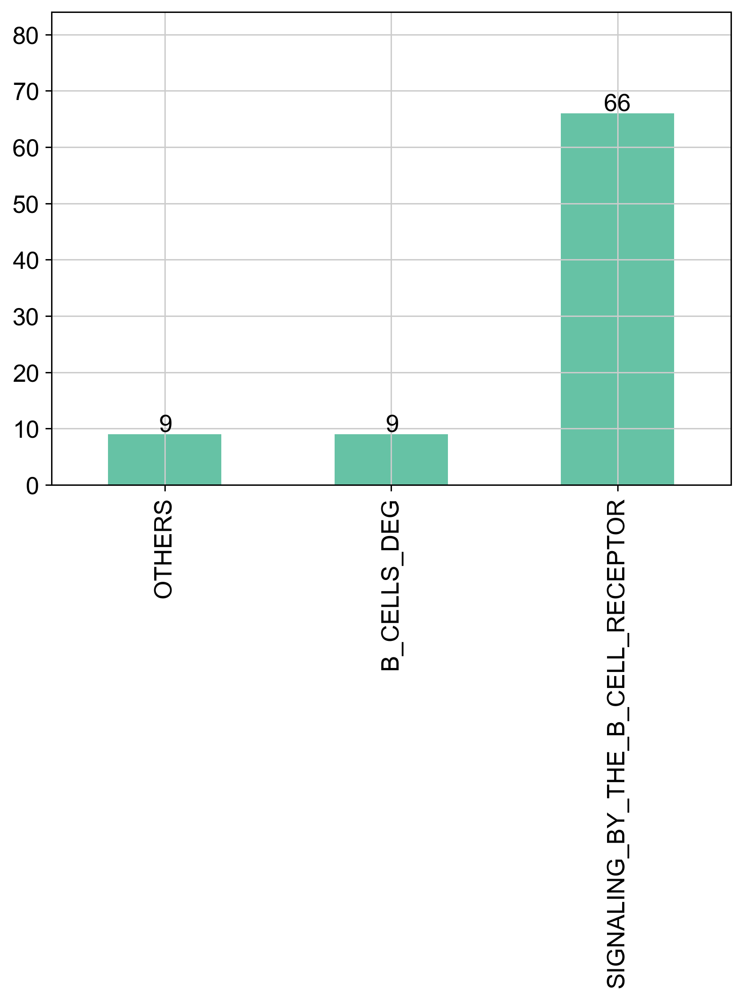

In [233]:
ax = df.T.plot.bar(figsize=(7,5), ylim=(0,b_nz.sum()), legend=False)
for p in ax.patches:
    height = p.get_height()
    if height > 9:
        w_coeff = 0.38
    else:
        w_coeff = 0.45
    ax.annotate(str(height), xy=(p.get_x() + w_coeff*p.get_width(), p.get_height() + 0.5))

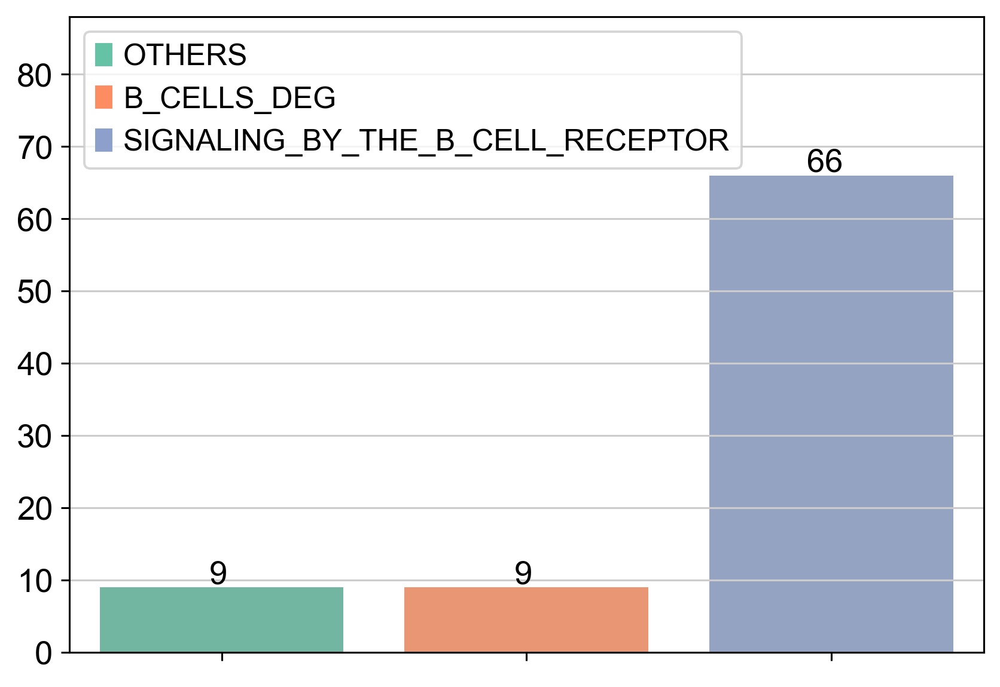

In [234]:
sb.set_palette("Set2")
ax = sb.barplot(data=df)
ax.set(ylim=(0,b_nz.sum()+4))
for p in ax.patches:
    height = p.get_height()
    if height > 9:
        w_coeff = 0.4
    else:
        w_coeff = 0.45
    ax.annotate(str(int(height)), xy=(p.get_x() + w_coeff*p.get_width(), p.get_height() + 0.5))

patches = [matplotlib.patches.Patch(color=sb.color_palette()[i], label=t) for i,t in enumerate(t.get_text() for t in ax.get_xticklabels())]
plt.legend(handles=patches, loc="upper left")
ax.xaxis.set_ticklabels([])

ax.figure.set_size_inches(7, 5)

In [186]:
b_table = pd.DataFrame(index=adata.var_names[b_nz].tolist())

In [187]:
ann_b_sign = q_intr_cvae.model.decoder.L0.ext_L_m.weight[:, 0].data.cpu().numpy()

In [188]:
b_table['decoder_weights'] = ann_b_sign[b_nz]

In [189]:
b_table['weights_abs'] = ann_b[b_nz]

In [190]:
b_table['group'] = 'OTHERS'

In [191]:
b_names = adata.var_names[query_mask.flatten().astype(bool)]

In [192]:
b_table['group'][b_table.index.isin(b_names)] = 'SIGNALING_BY_THE_B_CELL_RECEPTOR'

In [193]:
b_de_names = list(set(not_b_names).intersection(kang_proc.uns['b_de']['names']['B']))

In [194]:
b_table['group'][b_table.index.isin(b_de_names)] = 'B_CELLS_DEG'

In [195]:
b_table.sort_values('weights_abs', ascending=False, inplace=True)

In [196]:
del b_table['weights_abs']

In [197]:
b_table

,decoder_weights,group
CD79A,1.179891,SIGNALING_BY_THE_B_CELL_RECEPTOR
CD19,0.966967,SIGNALING_BY_THE_B_CELL_RECEPTOR
BLNK,0.932027,SIGNALING_BY_THE_B_CELL_RECEPTOR
BLK,0.912320,SIGNALING_BY_THE_B_CELL_RECEPTOR
CD79B,0.788434,SIGNALING_BY_THE_B_CELL_RECEPTOR
...,...,...
RGS2,0.000081,OTHERS
GBP4,0.000054,OTHERS
IFITM3,-0.000050,OTHERS
IRF1,0.000039,OTHERS


In [198]:
b_table.to_csv('b_node.csv')

In [88]:
query_ct = kang_pbmc[kang_pbmc.obs.study == 'Kang'].obs.cell_type_joint.unique().tolist()

In [235]:
kang.obsm['X_cvae'] = q_intr_cvae.get_latent(mean=MEAN)

In [237]:
new_terms = kang.obsm['X_cvae'][:, -4:]

In [242]:
adata_pl = sc.AnnData(X=new_terms)

In [260]:
adata_pl.obs['cell_type'] = kang.obs['cell_type'].tolist().copy()

In [291]:
adata_pl.var_names = ['B masked', 'term 2', 'term 3', 'term 1']

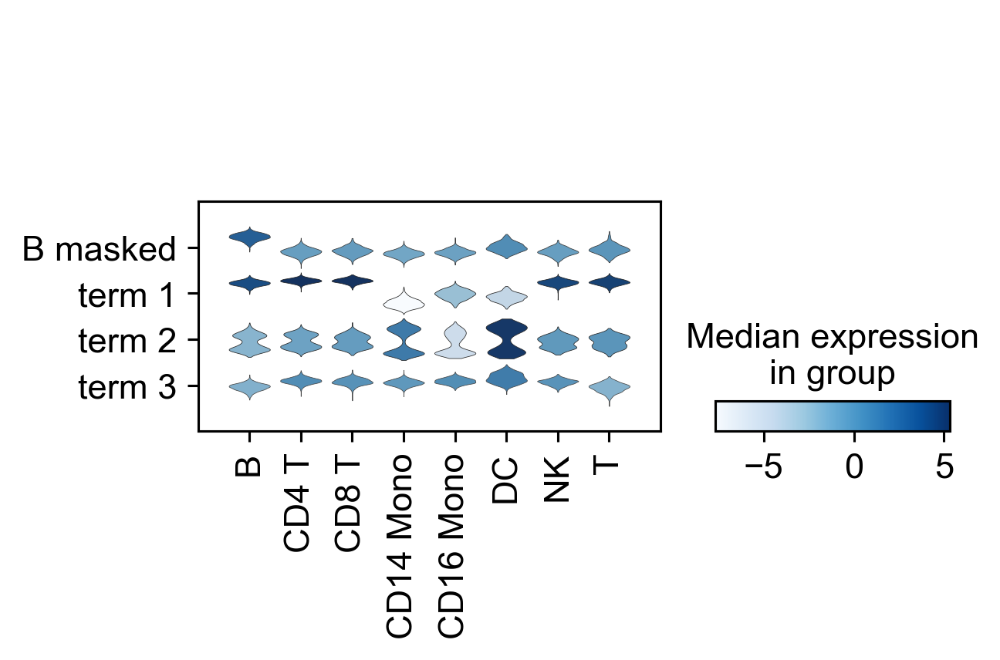

In [292]:
sc.pl.stacked_violin(adata_pl, var_names=['B masked', 'term 1', 'term 2', 'term 3'], groupby='cell_type', swap_axes=True)

In [97]:
kang_pbmc_ctq = kang_pbmc[kang_pbmc.obs.cell_type_joint.isin(query_ct)]

In [323]:
adata_pl_rq = sc.AnnData(X=kang_pbmc_ctq.obsm['X_cvae'][:, -4:])

In [324]:
adata_pl_rq.obs['cell_type_joint'] = kang_pbmc_ctq.obs['cell_type_joint'].tolist().copy()

In [325]:
adata_pl_rq.var_names = ['B masked', 'term 2', 'term 3', 'term 1']

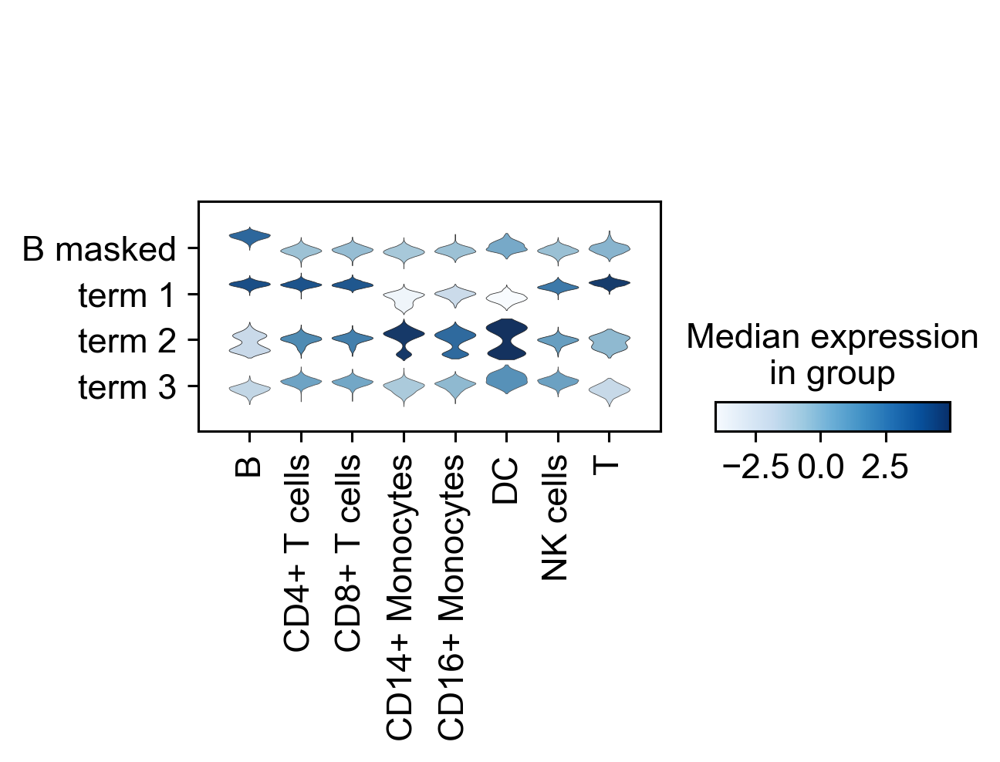

In [327]:
sc.pl.stacked_violin(adata_pl_rq, var_names=['B masked', 'term 1', 'term 2', 'term 3'], groupby='cell_type_joint', swap_axes=True)

In [58]:
kang_pbmc_q = kang_pbmc[kang_pbmc.obs.study == 'Kang']

In [59]:
adata_pl_q = sc.AnnData(X=kang_pbmc_q.obsm['X_cvae'][:, -4:])

In [60]:
adata_pl_q.obs['cell_type_joint'] = kang_pbmc_q.obs['cell_type_joint'].tolist().copy()

In [61]:
adata_pl_q.var_names = ['B masked', 'term 2', 'term 3', 'term 1']

... storing 'cell_type_joint' as categorical


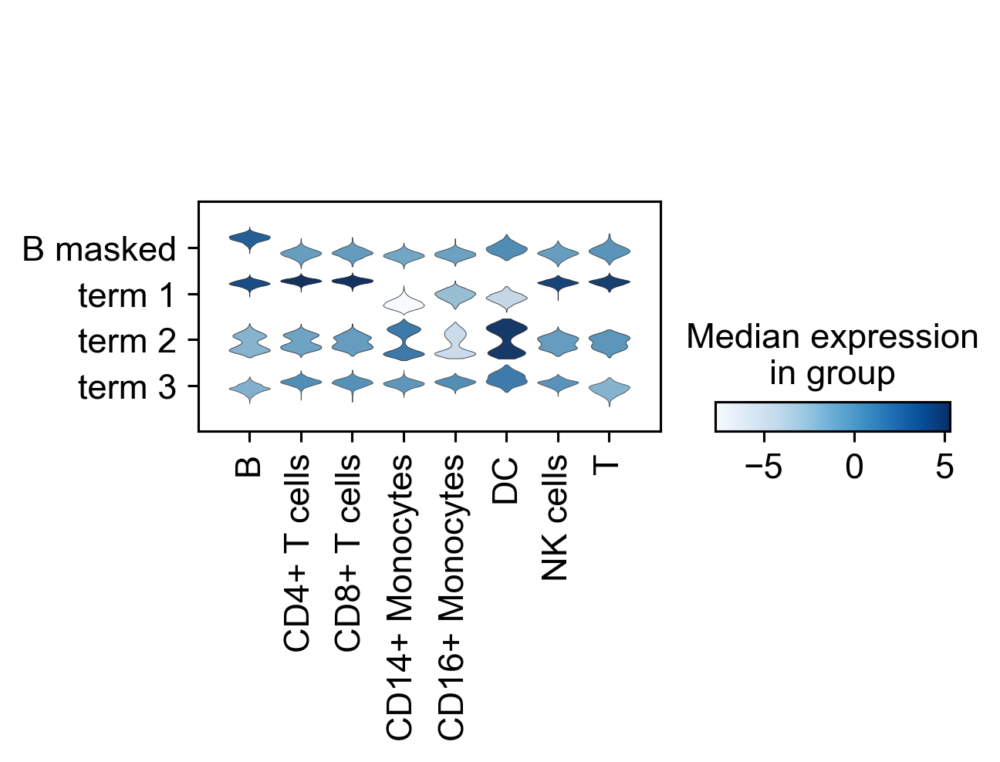

In [62]:
sc.pl.stacked_violin(adata_pl_q, var_names=['B masked', 'term 1', 'term 2', 'term 3'], groupby='cell_type_joint', swap_axes=True)

In [85]:
kang_pbmc.obs['condition_merged'] = kang_pbmc.obs['condition'].tolist()
kang_pbmc.obs['condition_merged'][kang_pbmc.obs['condition_merged'].isna()] = 'control (reference)'
kang_pbmc.obs['condition_merged'][kang_pbmc.obs['condition_merged'] == 'control'] = 'control (query)'
kang_pbmc.obs['condition_merged'][kang_pbmc.obs['condition_merged'] == 'stimulated'] = 'INF-beta'

In [104]:
if 'condition_merged_colors' in kang_pbmc.uns:
    del kang_pbmc.uns['condition_merged_colors']

Trying to set attribute `._uns` of view, copying.


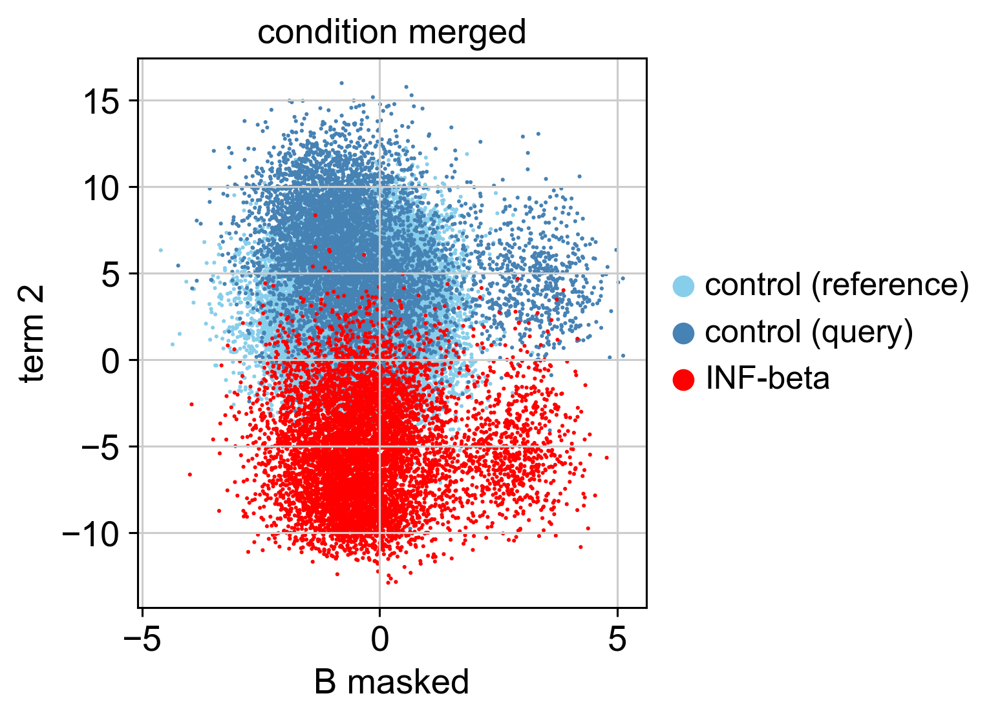

In [98]:
sc.pl.scatter(kang_pbmc_ctq, x='B masked', y='term 2', groups=['control (reference)', 'control (query)', 'INF-beta'], 
              color='condition_merged', palette=['red', 'steelblue', 'skyblue'], size=10)

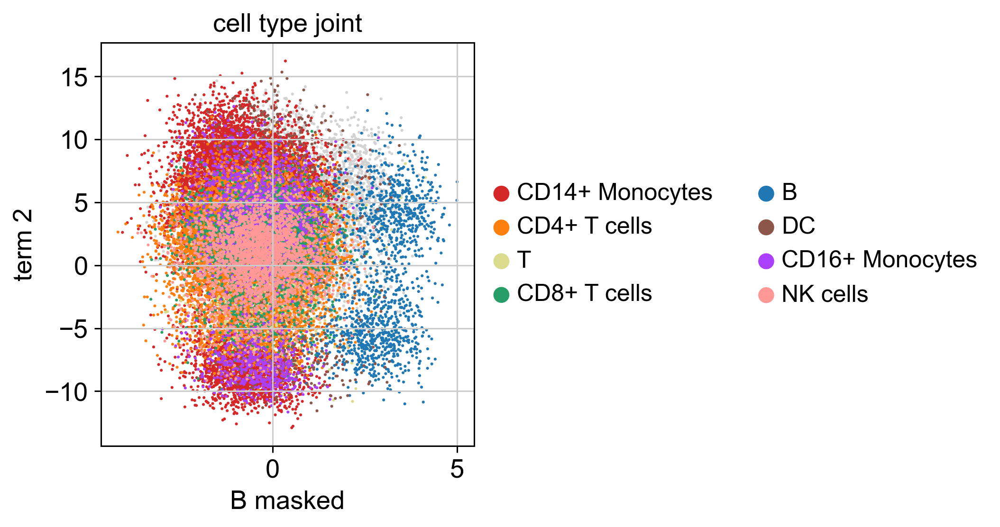

In [342]:
sc.pl.scatter(kang_pbmc, x='B masked', y='term 2', groups=query_ct, 
              color='cell_type_joint', size=10)

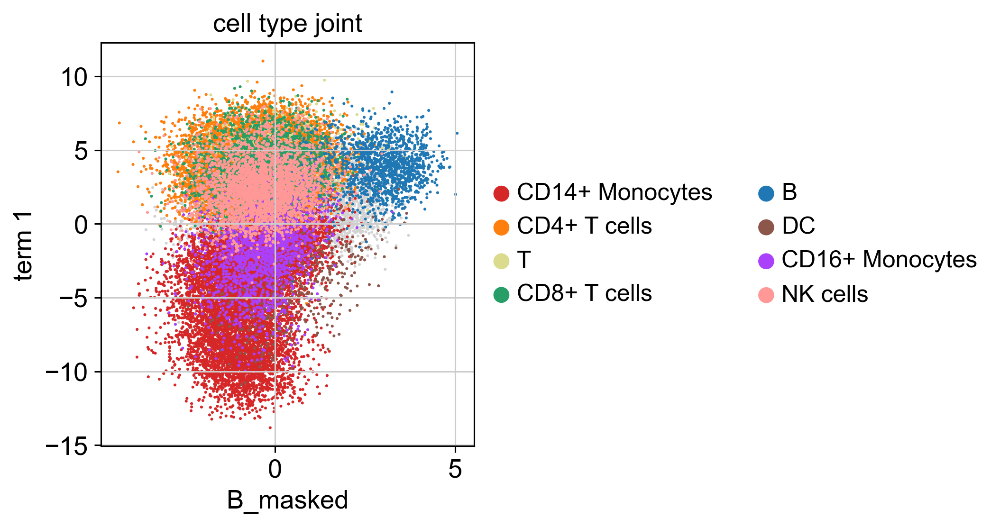

In [302]:
sc.pl.scatter(kang_pbmc, x='B_masked', y='term 1', groups=query_ct,
              color='cell_type_joint', size=10)

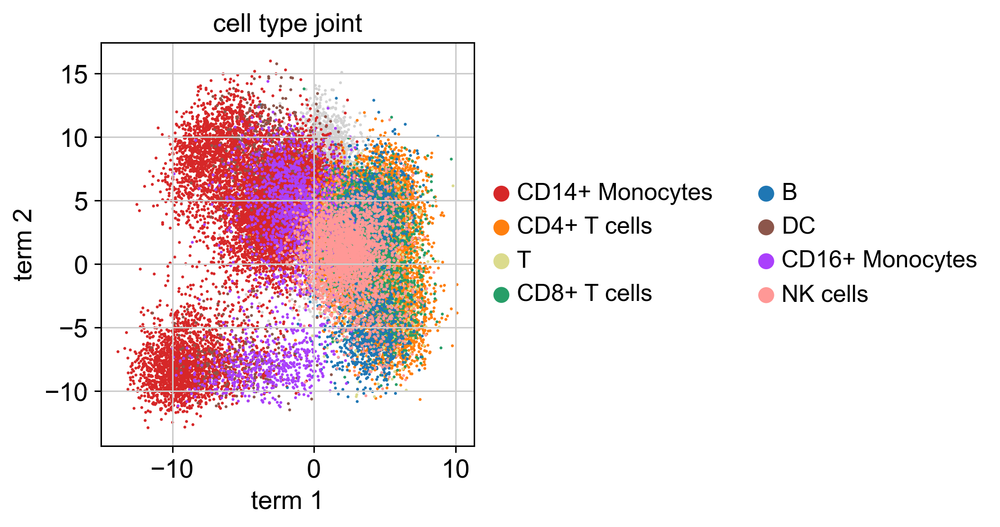

In [100]:
sc.pl.scatter(kang_pbmc, x='term 1', y='term 2', groups=query_ct,
              color='cell_type_joint', size=10)

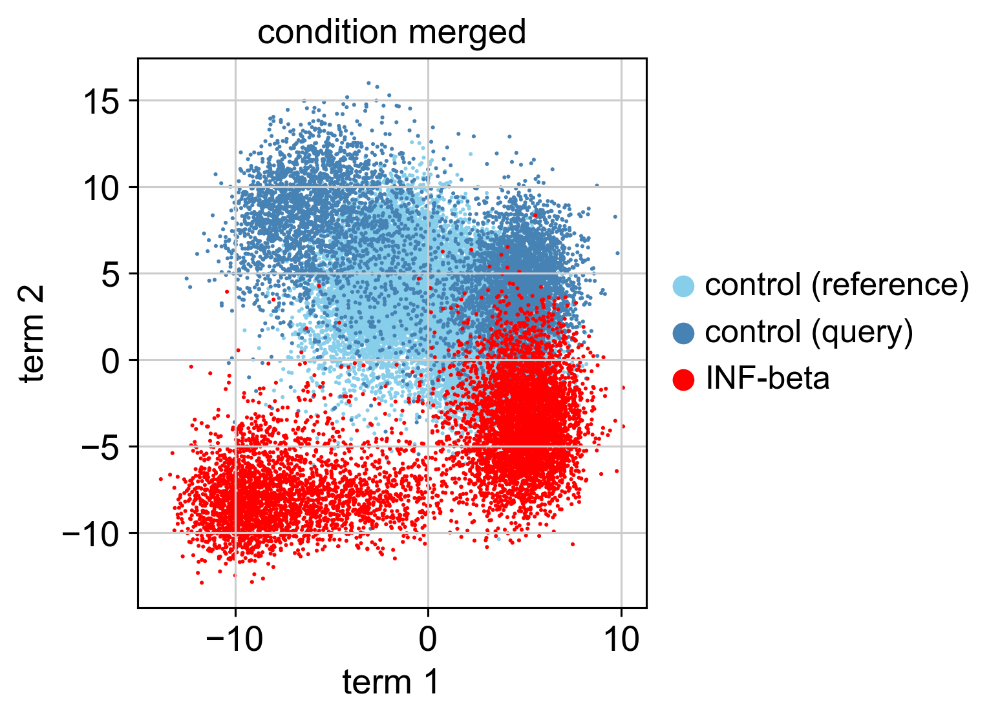

In [105]:
sc.pl.scatter(kang_pbmc_ctq, x='term 1', y='term 2', color='condition_merged', groups=['control (reference)', 'control (query)', 'INF-beta'], 
              palette=['red', 'steelblue', 'skyblue'], size=10)

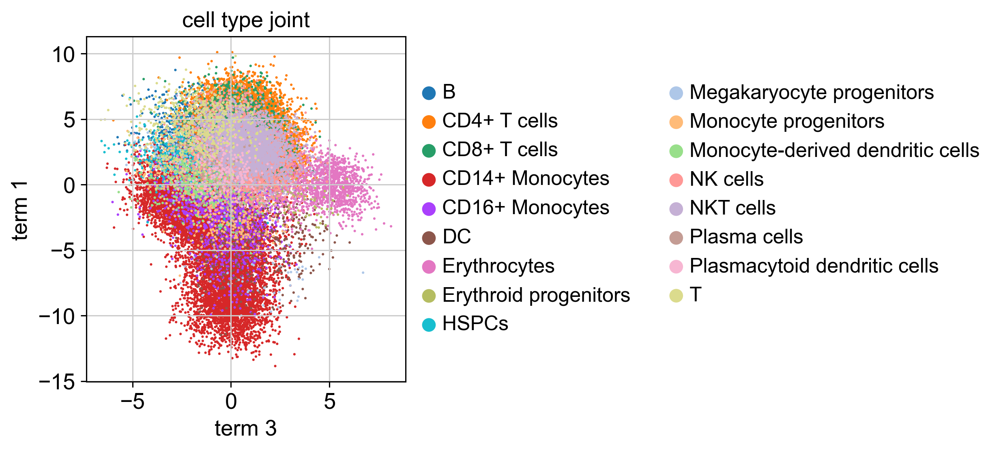

In [107]:
sc.pl.scatter(kang_pbmc, x='term 3', y='term 1',
              color='cell_type_joint', size=10)

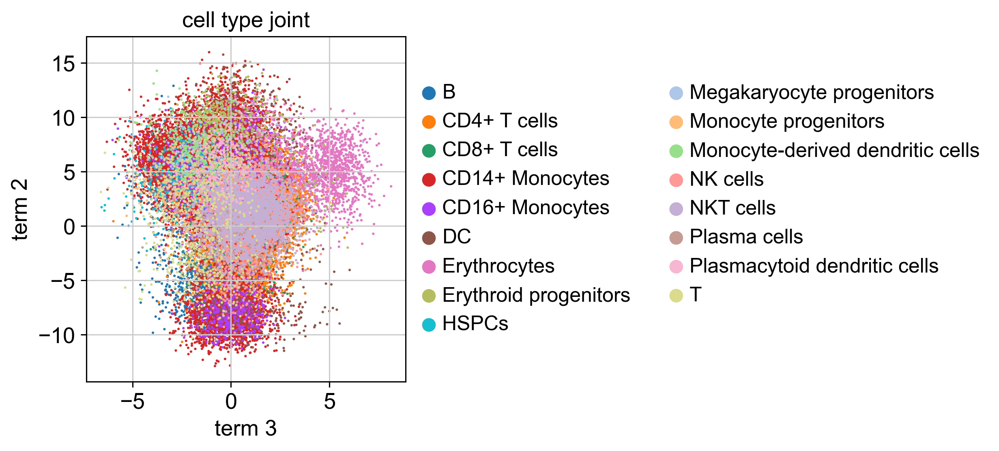

In [108]:
sc.pl.scatter(kang_pbmc, x='term 3', y='term 2',
              color='cell_type_joint', size=10)

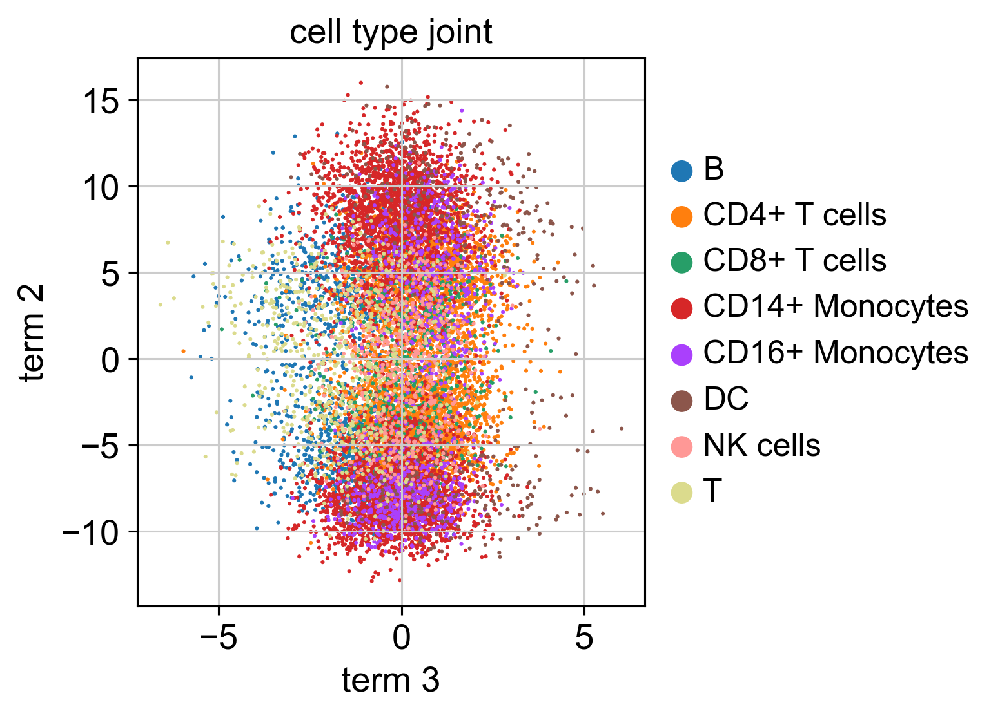

In [119]:
sc.pl.scatter(kang_pbmc[kang_pbmc.obs.study=='Kang'], x='term 3', y='term 2',
              color='cell_type_joint', size=10)

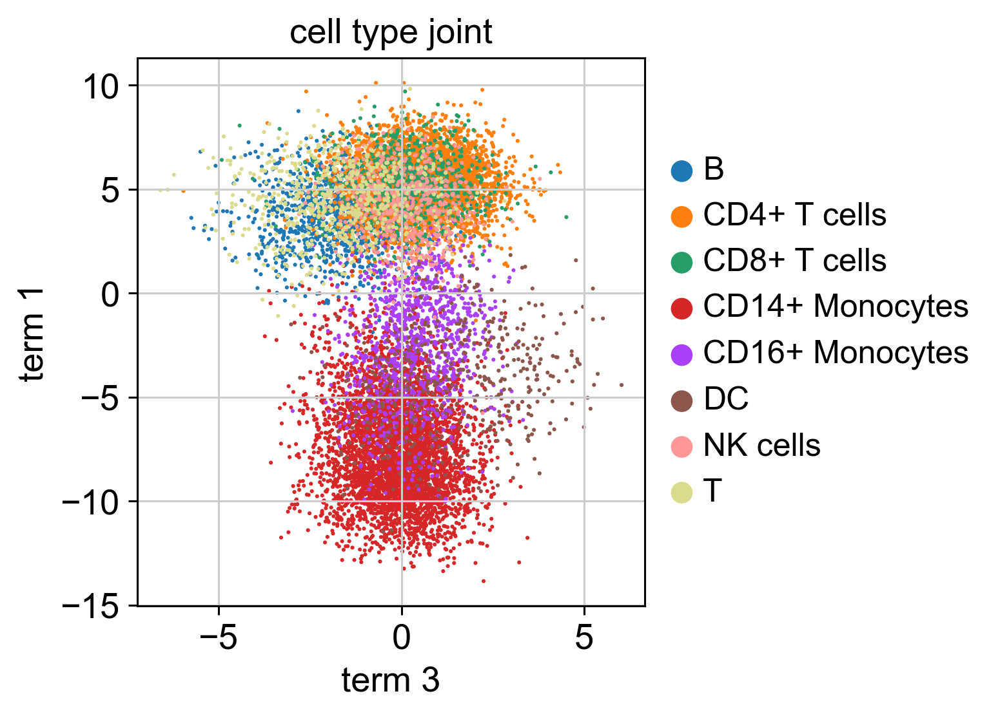

In [120]:
sc.pl.scatter(kang_pbmc[kang_pbmc.obs.study=='Kang'], x='term 3', y='term 1',
              color='cell_type_joint', size=10)

In [125]:
import seaborn as sns

In [214]:
def move_legend(ax, new_loc, title=None, **kws):
    old_legend = ax.legend_
    handles = old_legend.legendHandles
    labels = [t.get_text() for t in old_legend.get_texts()]
    title = old_legend.get_title().get_text() if title is None else title
    ax.legend(handles, labels, loc=new_loc, title=title, **kws)

In [229]:
term_3_df = sc.get.obs_df(kang_pbmc, keys=['term 3', 'cell_type_joint', 'condition_merged'])

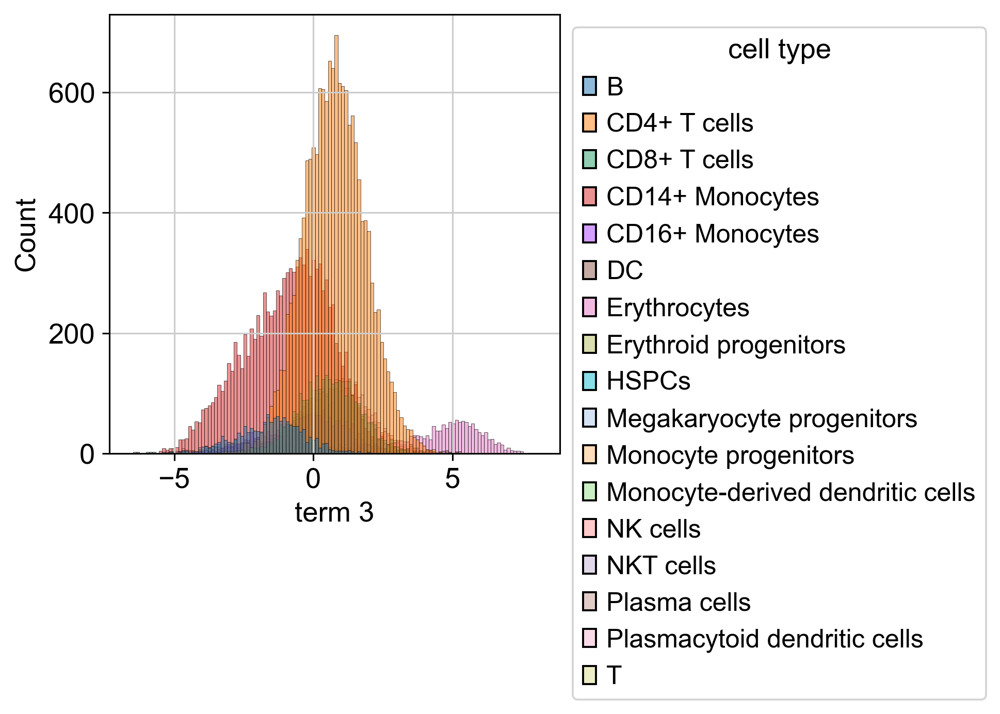

In [235]:
g = sns.histplot(data=term_3_df, x='term 3', hue='cell_type_joint', legend=True)
move_legend(g, 2, title='cell type', bbox_to_anchor=(1, 1))

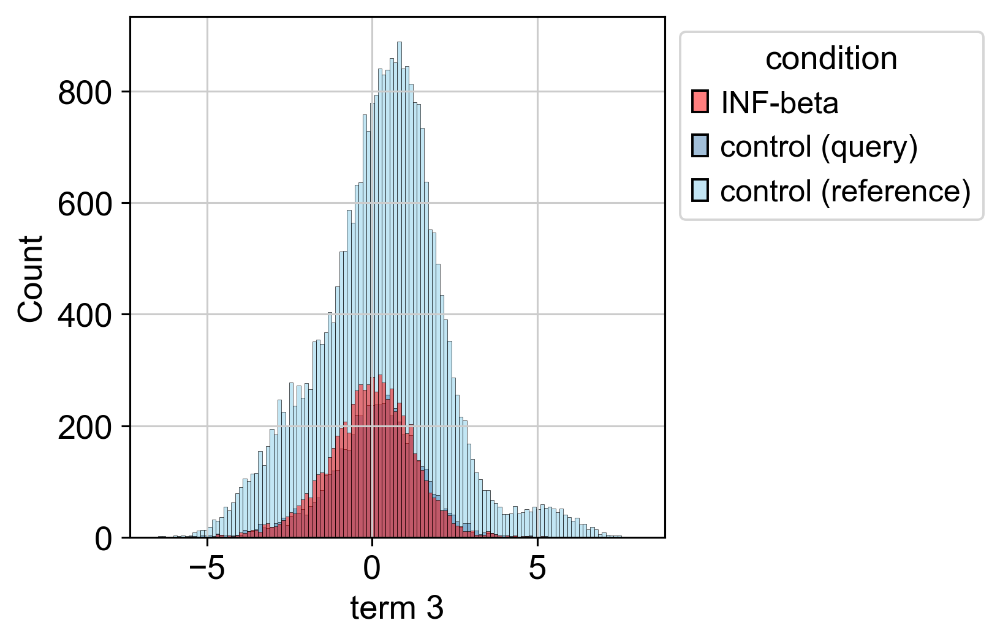

In [232]:
g = sns.histplot(data=term_3_df, x='term 3', hue='condition_merged', legend=True, palette=['red', 'steelblue', 'skyblue'])
move_legend(g, 2, title='condition', bbox_to_anchor=(1, 1))

In [233]:
term_3_df_q = sc.get.obs_df(kang_pbmc[kang_pbmc.obs.study=='Kang'], keys=['term 3', 'cell_type_joint', 'condition_merged'])

In [234]:
term_3_df_q['cell_type_joint'] = term_3_df_q['cell_type_joint'].cat.remove_unused_categories()

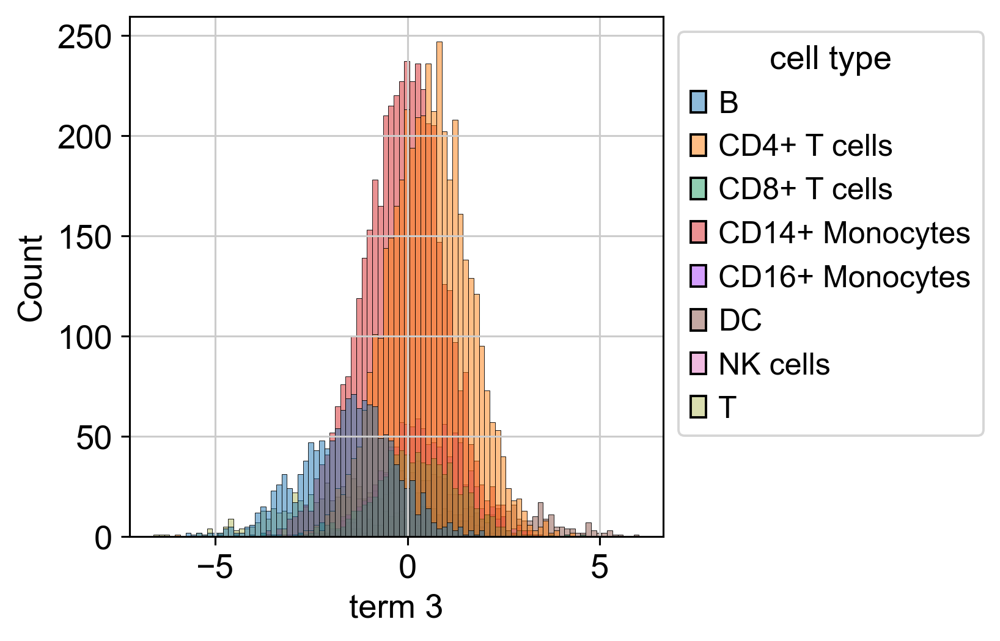

In [236]:
g = sns.histplot(data=term_3_df_q, x='term 3', hue='cell_type_joint', legend=True)
move_legend(g, 2, title='cell type', bbox_to_anchor=(1, 1))

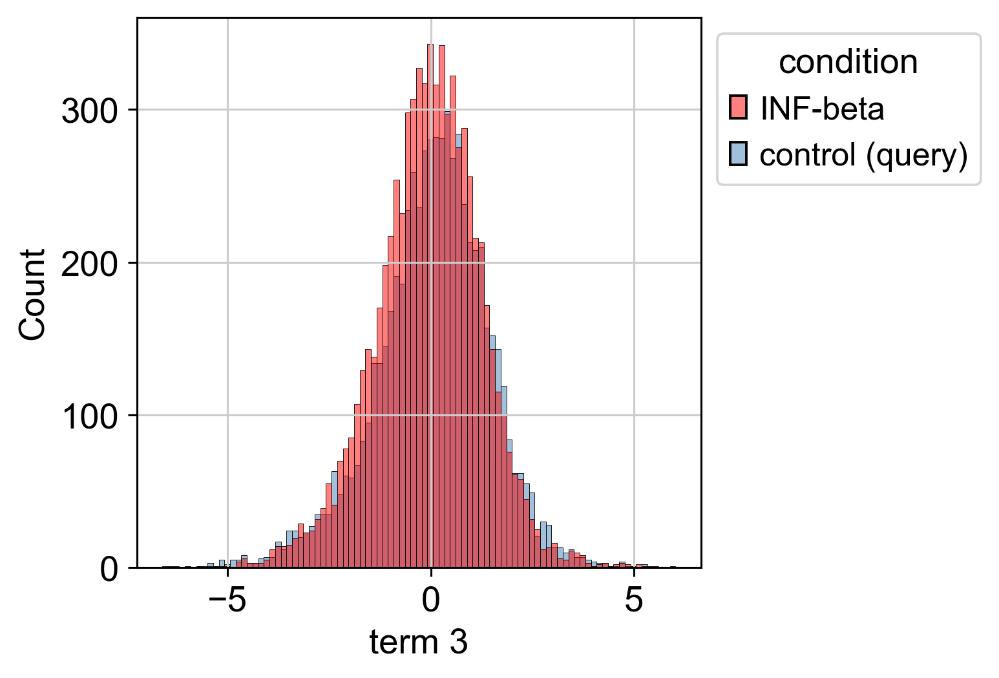

In [237]:
g = sns.histplot(data=term_3_df_q, x='term 3', hue='condition_merged', legend=True, palette=['red', 'steelblue'])
move_legend(g, 2, title='condition', bbox_to_anchor=(1, 1))

In [217]:
term_1_df = sc.get.obs_df(kang_pbmc, keys=['term 1', 'cell_type_joint', 'condition_merged'])

In [218]:
myeloids_rq = term_1_df[term_1_df.cell_type_joint.isin(['CD14+ Monocytes', 'CD16+ Monocytes', 'DC'])]

In [219]:
myeloids_rq['cell_type_joint'] = myeloids_rq['cell_type_joint'].cat.remove_unused_categories()

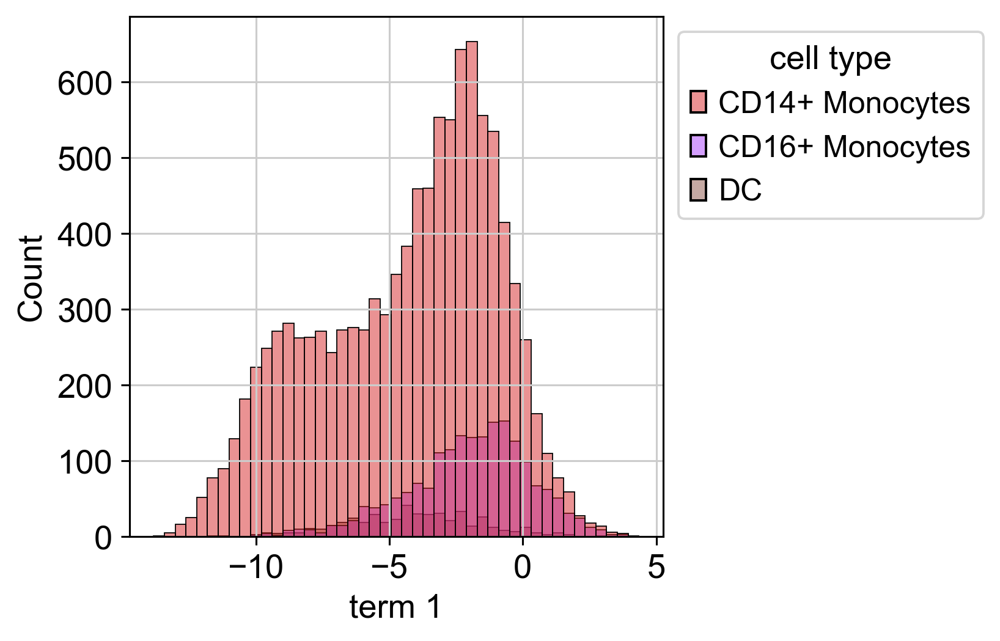

In [220]:
g = sns.histplot(data=myeloids_rq, x='term 1', hue='cell_type_joint', legend=True, palette=kang_pbmc.uns['cell_type_joint_colors'][3:6])
move_legend(g, 2, title='cell type', bbox_to_anchor=(1, 1))

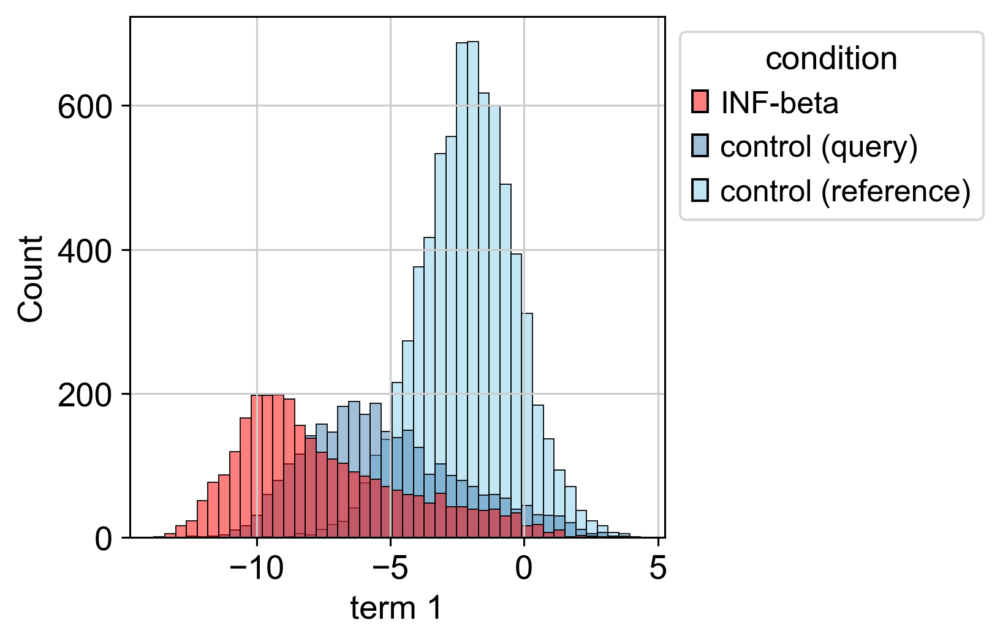

In [221]:
g = sns.histplot(data=myeloids_rq, x='term 1', hue='condition_merged', legend=True, palette=['red', 'steelblue', 'skyblue'])
move_legend(g, 2, title='condition', bbox_to_anchor=(1, 1))

In [222]:
term_1_df_q = sc.get.obs_df(kang_pbmc[kang_pbmc.obs.study=='Kang'], keys=['term 1', 'cell_type_joint', 'condition_merged'])

In [223]:
myeloids_q = term_1_df_q[term_1_df_q.cell_type_joint.isin(['CD14+ Monocytes', 'CD16+ Monocytes', 'DC'])]

In [225]:
myeloids_q['cell_type_joint'] = myeloids_q['cell_type_joint'].cat.remove_unused_categories()

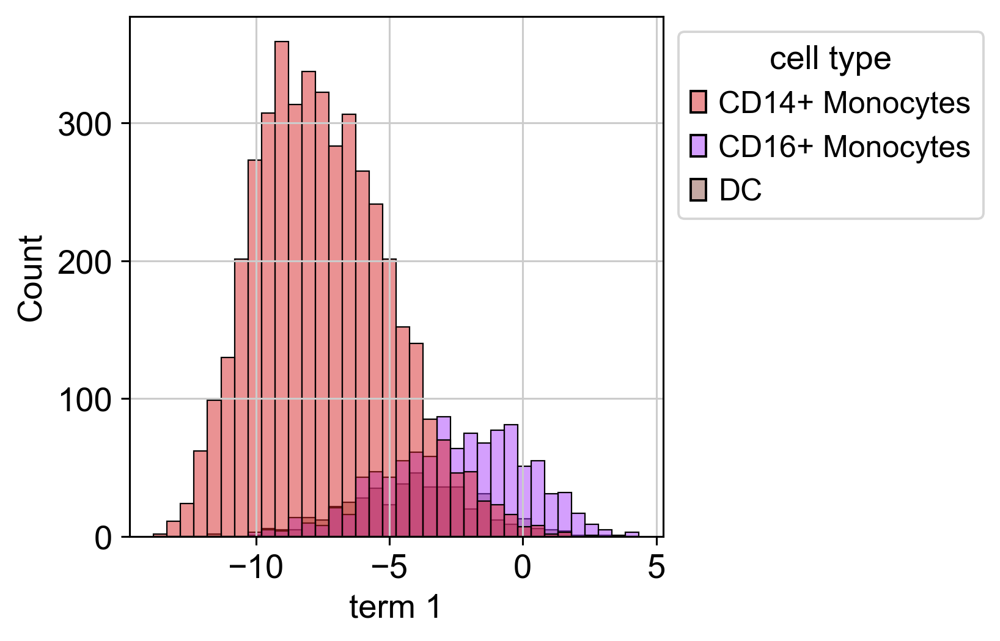

In [226]:
g = sns.histplot(data=myeloids_q, x='term 1', hue='cell_type_joint', legend=True, palette=kang_pbmc.uns['cell_type_joint_colors'][3:6])
move_legend(g, 2, title='cell type', bbox_to_anchor=(1, 1))

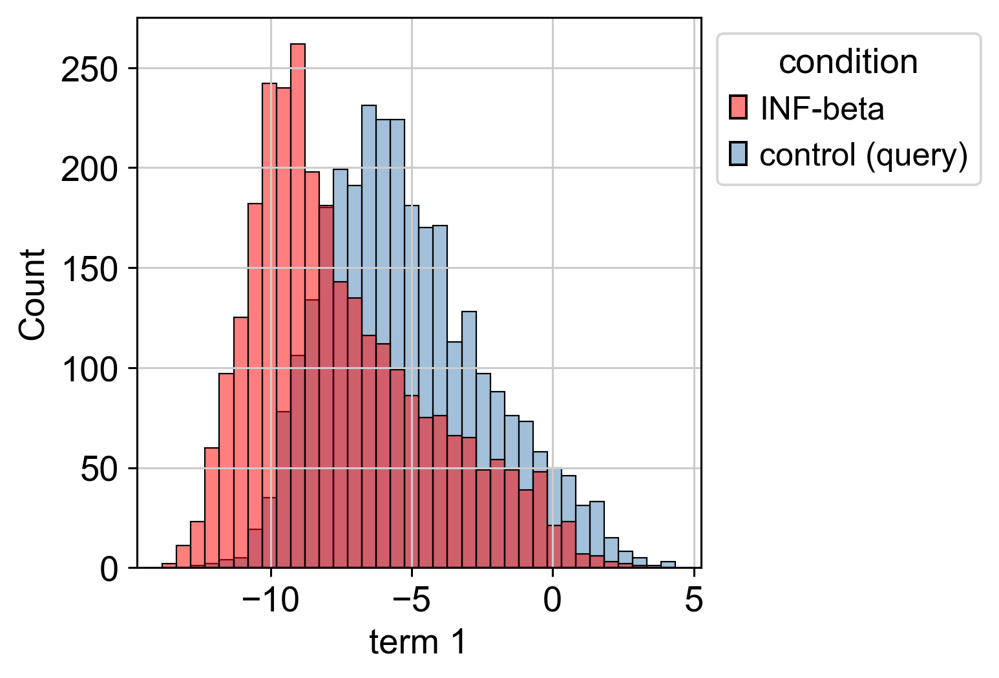

In [228]:
g = sns.histplot(data=myeloids_q, x='term 1', hue='condition_merged', legend=True, palette=['red', 'steelblue'])
move_legend(g, 2, title='condition', bbox_to_anchor=(1, 1))